<a href="https://colab.research.google.com/github/SakshamStha47/transit-equity-index-brooklyn/blob/main/notebooks/transit-equity-index-brooklyn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'DejaVu Serif'

In [2]:
!pip install pygris
!pip install contextily

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 4.3 MB/s eta 0:00:00


### Fix: Mount Google Drive

To resolve the `FileNotFoundError` and subsequently the `NameError`, you need to mount your Google Drive. This will allow the notebook to access files stored in your Drive.

In [3]:
from google.colab import drive
drive.mount('/content/drive')

print("Google Drive mounted successfully.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive mounted successfully.


### Importing census GPD using `pygris`

`pygris` is a Python package that provides an interface to the US Census Bureau's TIGER/Line shapefiles and other geographic data. It simplifies the process of downloading and working with this data in Python, making it easier to perform geographic analysis and visualization.

Using FIPS code '36' for input 'NY'
Using FIPS code '047' for input 'Kings'
  STATEFP COUNTYFP TRACTCE        GEOID NAME         NAMELSAD  MTFCC FUNCSTAT  \
0      36      047  000700  36047000700    7   Census Tract 7  G5020        S   
1      36      047  000900  36047000900    9   Census Tract 9  G5020        S   
2      36      047  001100  36047001100   11  Census Tract 11  G5020        S   
3      36      047  001300  36047001300   13  Census Tract 13  G5020        S   
4      36      047  002000  36047002000   20  Census Tract 20  G5020        S   

    ALAND  AWATER     INTPTLAT      INTPTLON  \
0  176774       0  +40.6923505  -073.9973434   
1  163469       0  +40.6917206  -073.9916018   
2  168507       0  +40.6932903  -073.9877087   
3  293167       0  +40.6976150  -073.9883586   
4  154138       0  +40.6480407  -074.0159276   

                                            geometry  
0  POLYGON ((-74.00154 40.69279, -74.00132 40.693...  
1  POLYGON ((-73.99405 40.6909, -73.99

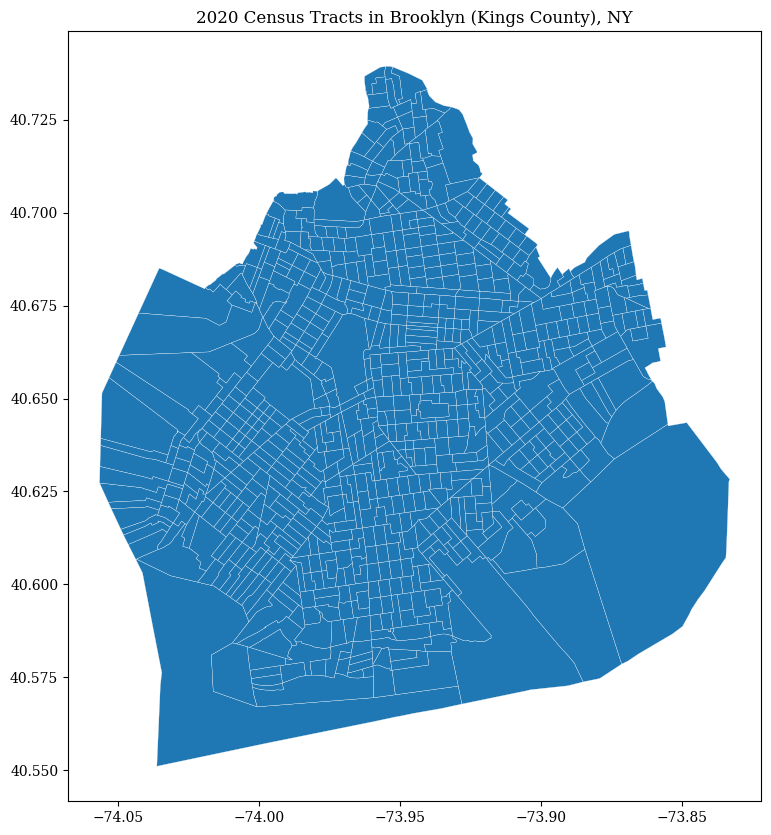

In [4]:
import pygris
import matplotlib.pyplot as plt


# Download the 2020 Census Tracts for Kings County (Brooklyn), NY
# 'county' parameter expects FIPS code, Kings County is 047
# 'state' parameter expects FIPS code or state abbreviation, New York is 'NY'
brooklyn_tracts = pygris.tracts(state='NY', county='Kings', year=2020, cache=True)

# Display the first few rows of the GeoDataFrame
print(brooklyn_tracts.head())

# Plot the shapefile (optional, for visualization)
fig, ax = plt.subplots(figsize=(10, 10))
brooklyn_tracts.plot(ax=ax, edgecolor='white', linewidth=0.2)
ax.set_title('2020 Census Tracts in Brooklyn (Kings County), NY')
plt.show()

Poverty Level Data Cleanup and Visualization

In [5]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler

In [6]:
def load_and_clean_data(file_path, value_cols, min_hh):
  """
  Loads the census data, cleans up geo ID, type conversions, and filter outliers
  file path -> file path of the census data
  value_cols -> list of columns to be extracted (the first column in the list must always be total household counts.)
  min_hh -> minimum number of households to be excluded
  """

  # 1. Read the csv data and format the GEO_ID
  df = pd.read_csv(file_path)
  df['GEO_ID'] = df['GEO_ID'].str.split('US').str[-1]

  # 2. Extract only necessary data
  all_cols = ['GEO_ID'] + value_cols
  df = df[all_cols].copy()
  for cols in value_cols:
    df[cols] = pd.to_numeric(df[cols], errors='coerce')

  # 3. Handle outliers by capping household count to >100
  total_hh_cols = value_cols[0]
  df = df[df[total_hh_cols] >= min_hh].copy()

  return df

In [7]:
def transform_scale_and_merge(base_gdf, df, feature_col, prefix, transform_type='none'):
  """
  Transforms a feature, scales it, and then merges it back with base GDF
    base_gdf -> original GeoDataFrame
    df -> cleaned DF
    feature_col ->
    prefix -> name to be provided to merged df
    transform_type -> 'log', 'sqrt' or 'none'
  """

  # 1. Apply chosen mathematical transformation
  trans_col = f'{prefix}_transformed'
  if transform_type == 'log':
    df[trans_col] = np.log1p(df[feature_col])
  elif transform_type == 'sqrt':
    df[trans_col] = np.sqrt(df[feature_col])
  else:
    df[trans_col] = df[feature_col]

  # 2. Scale the transformed data
  norm_col =f'norm_{prefix}'
  df[norm_col] = StandardScaler().fit_transform(df[trans_col].values.reshape(-1, 1))

  # 3. Merge back to the base GDF
  merged_df = base_gdf.merge(df, left_on='GEOID', right_on='GEO_ID', how='left')

  return merged_df


In [8]:
# ZERO VEHICLE OWNERSHIP DATA

# 1. Clean the data
zero_car_cleaned = load_and_clean_data('/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/Vehicle.csv', ['B25044_001E', 'B25044_003E', 'B25044_010E'], 100)

# 2. Calculate the metric
zero_car_cleaned['zero_car_percentage'] = (zero_car_cleaned['B25044_003E'] + zero_car_cleaned['B25044_010E'])/zero_car_cleaned['B25044_001E'] * 100

# 3. Transform and merge
zero_car_merged = transform_scale_and_merge(brooklyn_tracts, zero_car_cleaned, 'zero_car_percentage', 'zero_car', 'none')

In [9]:
# POVERTY STATUS DATA

# 1. Clean the data
poverty_cleaned = load_and_clean_data('/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/Poverty.csv', ['B17017_001E', 'B17017_002E'], 100)

# 2. Calculate the metric
poverty_cleaned['poverty_percentage'] = (poverty_cleaned['B17017_002E'] / poverty_cleaned['B17017_001E']) * 100

# 3. Transform and merge
poverty_merged = transform_scale_and_merge(brooklyn_tracts, poverty_cleaned, 'poverty_percentage', 'poverty', 'sqrt')

In [91]:
# Save poverty_merged for later use
poverty_merged.to_csv('/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/poverty_merged.csv', index=False)

In [10]:
# UNEMPLOYMENT DATA

# 1. Clean the data
unemp_cleaned = load_and_clean_data('/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/unemployment.csv',['B23025_003E', 'B23025_005E'], 100)

# 2. Calculate the metric
unemp_cleaned['unemployment_percentage'] = (unemp_cleaned['B23025_005E'] / unemp_cleaned['B23025_003E']) * 100

# 3. Transform and merge
unemp_merged = transform_scale_and_merge(brooklyn_tracts, unemp_cleaned, 'unemployment_percentage', 'unemployment', 'log')

In [11]:
# POPULATION OVER 65 DATA

# 1. Clean the data
variable_list = ['B01001_001E', 'B01001_020E', 'B01001_021E', 'B01001_022E', 'B01001_023E', 'B01001_024E', 'B01001_025E', 'B01001_044E', 'B01001_045E', 'B01001_046E', 'B01001_047E', 'B01001_048E', 'B01001_049E']
sixtyfiveplus_cleaned = load_and_clean_data('/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/seniorcitizen.csv', variable_list, 100)

# 2. Calculate the metric
summation_variables = variable_list.copy()
summation_variables.remove('B01001_001E')
sixtyfiveplus_cleaned['sixtyfiveplus_percentage'] = (sixtyfiveplus_cleaned[summation_variables].sum(axis=1) / sixtyfiveplus_cleaned['B01001_001E']) * 100

# Transform and merge
sixtyfiveplus_merged = transform_scale_and_merge(brooklyn_tracts, sixtyfiveplus_cleaned, 'sixtyfiveplus_percentage', 'sixtyfiveplus', 'sqrt')

In [12]:
# POPULATION WITH DISABILITY

# 1. Clean the data
disability_cols = [
    'B18101_001E',
    'B18101_004E', 'B18101_007E', 'B18101_010E', 'B18101_013E', 'B18101_016E', 'B18101_019E',  # Male
    'B18101_023E', 'B18101_026E', 'B18101_029E', 'B18101_032E', 'B18101_035E', 'B18101_038E'   # Female
]
disability_cleaned = load_and_clean_data('/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/disability.csv', disability_cols, 100)

# 2. Calculate the metric
summation_cols = disability_cols.copy()
summation_cols.remove('B18101_001E')
disability_cleaned['disability_percentage'] = (disability_cleaned[summation_cols].sum(axis=1) / disability_cleaned['B18101_001E']) * 100

# Transform and merge
disability_merged = transform_scale_and_merge(brooklyn_tracts, disability_cleaned, 'disability_percentage', 'disability', 'log')

In [13]:
# NO INTERNET ACCESS

# 1. Clean the data
nointernet_cleaned = load_and_clean_data('/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/no-internet-access.csv', ['B28011_001E', 'B28011_008E'], 100)

# 2. Calculate the metric
nointernet_cleaned['nointernet_percentage'] = (nointernet_cleaned['B28011_008E'] / nointernet_cleaned['B28011_001E']) * 100

# Transform and merge
nointernet_merged = transform_scale_and_merge(brooklyn_tracts, nointernet_cleaned, 'nointernet_percentage', 'nointernet', 'log')

The `common_geoids` variable, used to filter out non-residential tracts, is defined in the following cell (`BE-nKztN1Jyi`).

In [14]:
# Filter out non-residential tracts BEFORE calculating Z-scores
min_household_threshold = 100
min_zero_car_households = 100

# Get the GEOIDs that meet both thresholds
valid_geoids1 = zero_car_merged['GEOID'].unique()
valid_geoids2 = poverty_merged['GEOID'].unique()
valid_geoids3 = unemp_merged['GEOID'].unique()
valid_geoids4 = sixtyfiveplus_merged['GEOID'].unique()
valid_geoids5 = disability_merged['GEOID'].unique()
valid_geoids6 = nointernet_merged['GEOID'].unique()

# Combine the valid GEOIDs from both filters
common_geoids = set.intersection(set(valid_geoids1), set(valid_geoids2), set(valid_geoids3), set(valid_geoids4), set(valid_geoids5), set(valid_geoids6))

# Filter merged_df1, merged_df2 ... merged_df6 based on these common valid GEOIDs
zero_car_merged = zero_car_merged[zero_car_merged['GEOID'].isin(common_geoids)]
poverty_merged = poverty_merged[poverty_merged['GEOID'].isin(common_geoids)]
unemp_merged = unemp_merged[unemp_merged['GEOID'].isin(common_geoids)]
sixtyfiveplus_merged = sixtyfiveplus_merged[sixtyfiveplus_merged['GEOID'].isin(common_geoids)]
isability_merged = disability_merged[disability_merged['GEOID'].isin(common_geoids)]
nointernet_merged = nointernet_merged[nointernet_merged['GEOID'].isin(common_geoids)]

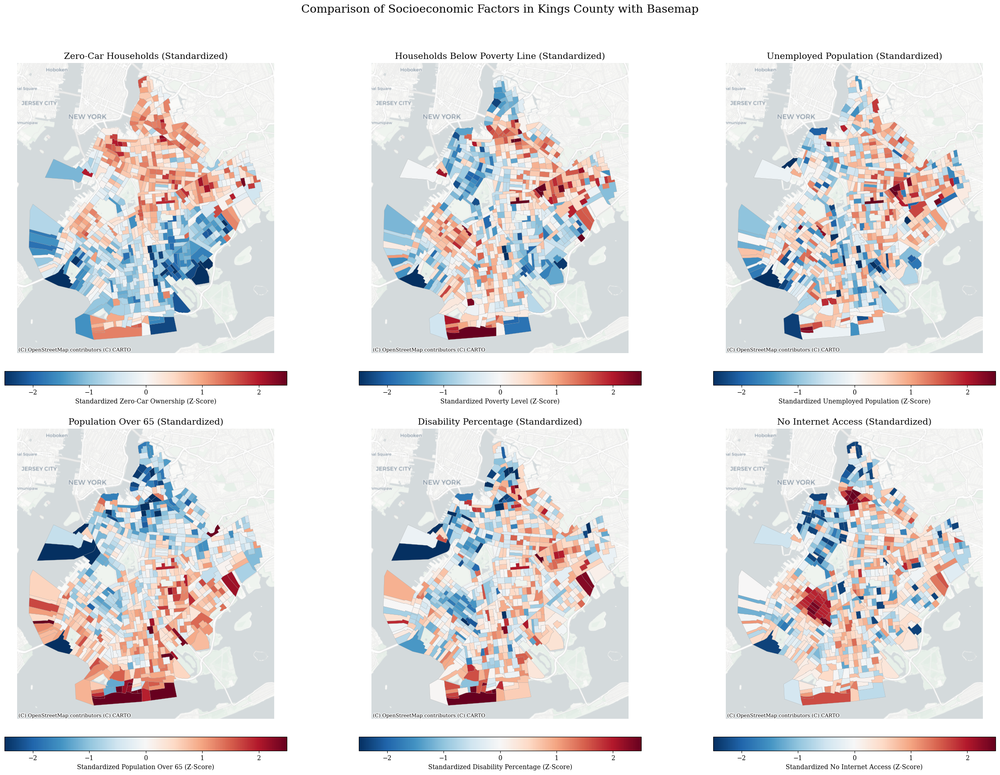

In [15]:
import matplotlib.pyplot as plt
import contextily as ctx # Make sure contextily is imported if basemaps are desired

# Create a figure with six subplots in a 2x3 grid and increase the figure size significantly
fig, axes = plt.subplots(2, 3, figsize=(25, 18))
axes = axes.flatten() # Flatten the 2x3 array of axes for easier iteration

# Standardizing the scale: Since it's Z-scores, centering around 0 is key.
# Capturing the bulk of the data between -2.5 and +2.5 standard deviations
# prevents extreme outliers from washing out the map.
vmin_val = -2.5
vmax_val = 2.5

# Using a diverging colormap ('RdBu_r': Red is high/positive, Blue is low/negative)
# This lets you immediately spot areas above or below the county average.
cmap_choice = "RdBu_r"

# Plot 1: Standardized Zero-Car Ownership
zero_car_merged.plot(
    column="norm_zero_car",
    cmap=cmap_choice,
    vmin=vmin_val,
    vmax=vmax_val,
    edgecolor="0.6",
    linewidth=0.2,
    legend=True,
    legend_kwds={
        "label": "Standardized Zero-Car Ownership (Z-Score)",
        "orientation": "horizontal",
        "pad": 0.05,
        "shrink": 0.7
    },
    ax=axes[0]
)
ctx.add_basemap(axes[0], crs=zero_car_merged.crs.to_string(), source=ctx.providers.CartoDB.Positron)
axes[0].set_title("Zero-Car Households (Standardized)", fontsize=14)
axes[0].axis("off")

# Plot 2: Standardized Poverty Level
poverty_merged.plot(
    column="norm_poverty",
    cmap=cmap_choice,
    vmin=vmin_val,
    vmax=vmax_val,
    edgecolor="0.6",
    linewidth=0.2,
    legend=True,
    legend_kwds={
        "label": "Standardized Poverty Level (Z-Score)",
        "orientation": "horizontal",
        "pad": 0.05,
        "shrink": 0.7
    },
    ax=axes[1]
)
ctx.add_basemap(axes[1], crs=poverty_merged.crs.to_string(), source=ctx.providers.CartoDB.Positron)
axes[1].set_title("Households Below Poverty Line (Standardized)", fontsize=14)
axes[1].axis("off")

# Plot 3: Standardized Unemployed Population
unemp_merged.plot(
    column="norm_unemployment", # Changed from "norm_unemp" to "norm_unemployment"
    cmap=cmap_choice,
    vmin=vmin_val,
    vmax=vmax_val,
    edgecolor="0.6",
    linewidth=0.2,
    legend=True,
    legend_kwds={
        "label": "Standardized Unemployed Population (Z-Score)",
        "orientation": "horizontal",
        "pad": 0.05,
        "shrink": 0.7
    },
    ax=axes[2]
)
ctx.add_basemap(axes[2], crs=unemp_merged.crs.to_string(), source=ctx.providers.CartoDB.Positron)
axes[2].set_title("Unemployed Population (Standardized)", fontsize=14)
axes[2].axis("off")

# Plot 4: Standardized Population Over 65
sixtyfiveplus_merged.plot(
    column="norm_sixtyfiveplus",
    cmap=cmap_choice,
    vmin=vmin_val,
    vmax=vmax_val,
    edgecolor="0.6",
    linewidth=0.2,
    legend=True,
    legend_kwds={
        "label": "Standardized Population Over 65 (Z-Score)",
        "orientation": "horizontal",
        "pad": 0.05,
        "shrink": 0.7
    },
    ax=axes[3]
)
ctx.add_basemap(axes[3], crs=sixtyfiveplus_merged.crs.to_string(), source=ctx.providers.CartoDB.Positron)
axes[3].set_title("Population Over 65 (Standardized)", fontsize=14)
axes[3].axis("off")

# Plot 5: Standardized Disability Percentage
disability_merged.plot(
    column="norm_disability",
    cmap=cmap_choice,
    vmin=vmin_val,
    vmax=vmax_val,
    edgecolor="0.6",
    linewidth=0.2,
    legend=True,
    legend_kwds={
        "label": "Standardized Disability Percentage (Z-Score)",
        "orientation": "horizontal",
        "pad": 0.05,
        "shrink": 0.7
    },
    ax=axes[4]
)
ctx.add_basemap(axes[4], crs=disability_merged.crs.to_string(), source=ctx.providers.CartoDB.Positron)
axes[4].set_title("Disability Percentage (Standardized)", fontsize=14)
axes[4].axis("off")

# Plot 6: Standardized No Internet Access Percentage
nointernet_merged.plot(
    column="norm_nointernet",
    cmap=cmap_choice,
    vmin=vmin_val,
    vmax=vmax_val,
    edgecolor="0.6",
    linewidth=0.2,
    legend=True,
    legend_kwds={
        "label": "Standardized No Internet Access (Z-Score)",
        "orientation": "horizontal",
        "pad": 0.05,
        "shrink": 0.7
    },
    ax=axes[5]
)
ctx.add_basemap(axes[5], crs=nointernet_merged.crs.to_string(), source=ctx.providers.CartoDB.Positron)
axes[5].set_title("No Internet Access (Standardized)", fontsize=14)
axes[5].axis("off")

plt.suptitle("Comparison of Socioeconomic Factors in Kings County with Basemap", fontsize=18, y=0.98) # Adjust suptitle font size and position
plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust rect to make space for the suptitle
plt.show()

# **Correlation Matrix**

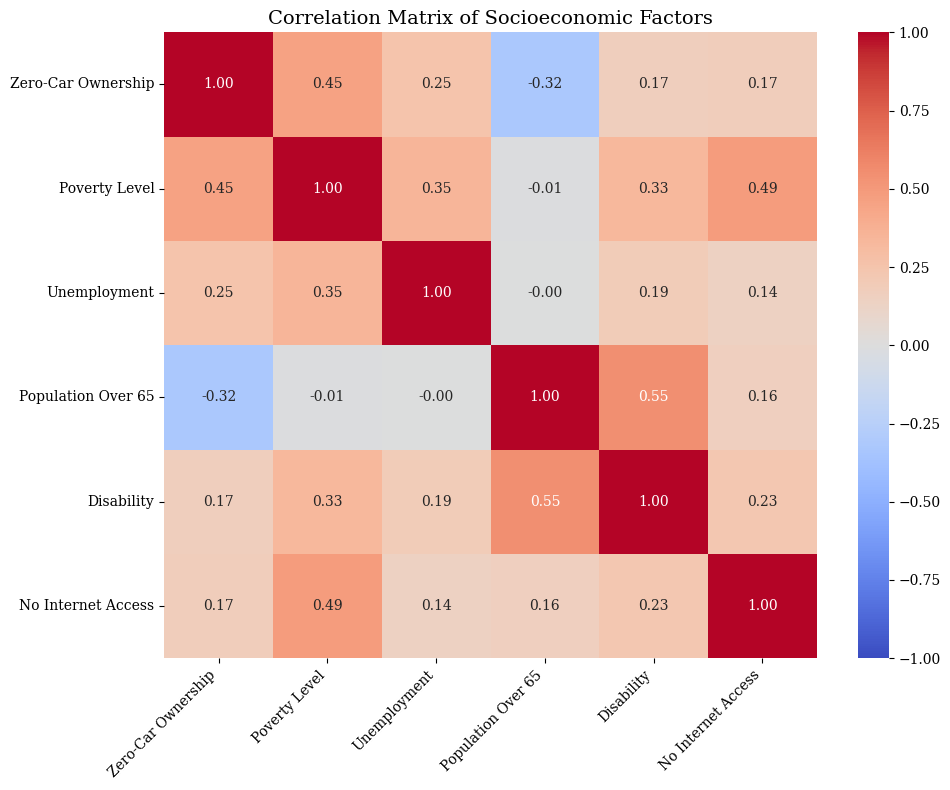

In [16]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Start with GEOID and norm_car from zero_car_merged
correlation_data = zero_car_merged[['GEOID', 'norm_zero_car']].copy()

# Merge other normalized columns from their respective dataframes
correlation_data = correlation_data.merge(poverty_merged[['GEOID', 'norm_poverty']], on='GEOID', how='left')
correlation_data = correlation_data.merge(unemp_merged[['GEOID', 'norm_unemployment']], on='GEOID', how='left')
correlation_data = correlation_data.merge(sixtyfiveplus_merged[['GEOID', 'norm_sixtyfiveplus']], on='GEOID', how='left')
correlation_data = correlation_data.merge(disability_merged[['GEOID', 'norm_disability']], on='GEOID', how='left')
correlation_data = correlation_data.merge(nointernet_merged[['GEOID', 'norm_nointernet']], on='GEOID', how='left')

# Calculate the correlation matrix
# Exclude 'GEOID' before calculating correlation
cov_matrix = correlation_data.drop(columns=['GEOID']).corr()

# Define new labels for the correlation matrix
new_labels = {
    'norm_zero_car': 'Zero-Car Ownership',
    'norm_poverty': 'Poverty Level',
    'norm_unemployment': 'Unemployment',
    'norm_sixtyfiveplus': 'Population Over 65',
    'norm_disability': 'Disability',
    'norm_nointernet': 'No Internet Access'
}

# Rename the index and columns of the covariance matrix for plotting
plot_cov_matrix = cov_matrix.rename(columns=new_labels, index=new_labels)

plt.figure(figsize = (10, 8)) # Increased figure size slightly for better label readability
sns.heatmap(plot_cov_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt='.2f',
            xticklabels=True, yticklabels=True)
plt.title('Correlation Matrix of Socioeconomic Factors', fontsize=14) # Added font size for title
plt.xticks(rotation=45, ha='right') # Rotate x-axis labels for better readability
plt.yticks(rotation=0) # Keep y-axis labels horizontal
plt.tight_layout() # Adjust layout to prevent labels from being cut off
plt.show()

In [17]:
from sklearn.decomposition import PCA

# 1. Isolate the standardized columns for PCA
standardized_cols = ['norm_zero_car', 'norm_poverty', 'norm_unemployment', 'norm_sixtyfiveplus', 'norm_disability', 'norm_nointernet']
standardized_data = correlation_data[standardized_cols]

# Handle NaN values: PCA cannot process missing data. We will drop rows with any NaN values.
initial_rows = len(standardized_data)
standardized_data_cleaned = standardized_data.dropna()

if len(standardized_data_cleaned) < initial_rows:
    print(f"Warning: Dropped {initial_rows - len(standardized_data_cleaned)} rows due to NaN values before PCA.")
    print(f"Remaining {len(standardized_data_cleaned)} rows for PCA.")

# 2. Perform PCA
pca = PCA(n_components=None) # n_components=None means all components will be kept
X_pca = pca.fit_transform(standardized_data_cleaned) # Use the cleaned data

# 3. Check how much information each component captures
for i, variance in enumerate(pca.explained_variance_ratio_):
    print(f"Component {i+1}: {variance:.2%}")

print("\n--- COMPONENT LOADINGS (THE WEIGHTS) ---")
# 4. Create a readable DataFrame of the loadings matrix
loadings = pd.DataFrame(
    pca.components_.T,
    columns=[f'PC{i+1}' for i in range(len(standardized_cols))],
    index=standardized_cols
)
print(loadings.round(3))

Remaining 774 rows for PCA.
Component 1: 36.29%
Component 2: 25.35%
Component 3: 14.49%
Component 4: 12.37%
Component 5: 6.70%
Component 6: 4.80%

--- COMPONENT LOADINGS (THE WEIGHTS) ---
                      PC1    PC2    PC3    PC4    PC5    PC6
norm_zero_car       0.411 -0.453  0.066 -0.557 -0.415  0.374
norm_poverty        0.579 -0.111 -0.166  0.017  0.776  0.145
norm_unemployment   0.371 -0.145  0.686  0.587 -0.162 -0.010
norm_sixtyfiveplus  0.099  0.731  0.103 -0.011 -0.071  0.663
norm_disability     0.383  0.461  0.251 -0.444 -0.041 -0.616
norm_nointernet     0.449  0.123 -0.651  0.384 -0.438 -0.142


## Analyzing the loadings of the Principal Components

###PC1: Systemic Socioeconomic Vulnerability

Variance Explained: 36.29%

Primary Drivers: High Poverty (0.579), No Internet (0.449), and Zero Car Ownership (0.411).

What it represents: This is your core equity indicator. It highlights areas facing overlapping layers of deep economic and logistical disadvantage. In a transit context, these populations represent high-dependence transit riders who rely on public transportation for basic survival, daily chores, and access to jobs.

</br>

###PC2: Age & Physical Mobility Needs

Variance Explained: 25.35%

Primary Drivers: Seniors (0.731) and People with Disabilities (0.461), shifting away from Zero-Car Ownership (-0.453).

What it represents: This component isolates demographic vulnerability rather than purely financial vulnerability. Because car ownership is negatively loaded here, it often highlights suburban or older neighborhoods where seniors might still own vehicles but face physical barriers to mobility. In your assessment, this points to areas requiring accessible infrastructure (e.g., paratransit, low-floor buses, and ADA-compliant stop design) rather than just high-frequency commuter routes.

</br>

###PC3: The Structural Unemployment Gap

Variance Explained: 14.49%

Primary Drivers: High Unemployment (0.686) contrasted sharply against No Internet Connectivity (-0.651).

What it represents: This component captures a specific disconnect: pockets where unemployment is high, but internet connectivity is actually relatively decent. In urban planning, this often points to younger, dense, or transitioning urban neighborhoods where residents are actively job-hunting or working gig jobs online but face high un- or underemployment. Transit-wise, these areas need strong off-peak and flexible service options for irregular work schedules.

</br>

###PC4: Disadvantaged Infrastructure Disconnect

Variance Explained: 12.37%

Primary Drivers: High Unemployment (0.587) and No Internet (0.384), contrasted against Zero Car Ownership (-0.557) and Disability (-0.444).

What it represents: This component isolates neighborhoods that are digitally and economically left behind (unemployment + no internet) but do have vehicles and fewer physical disabilities. This signature is typical of lower-income suburban or rural-edge communities where having a car is an absolute requirement to survive due to a complete lack of transit infrastructure, forcing families to take on high vehicle-inherent debt despite low incomes.

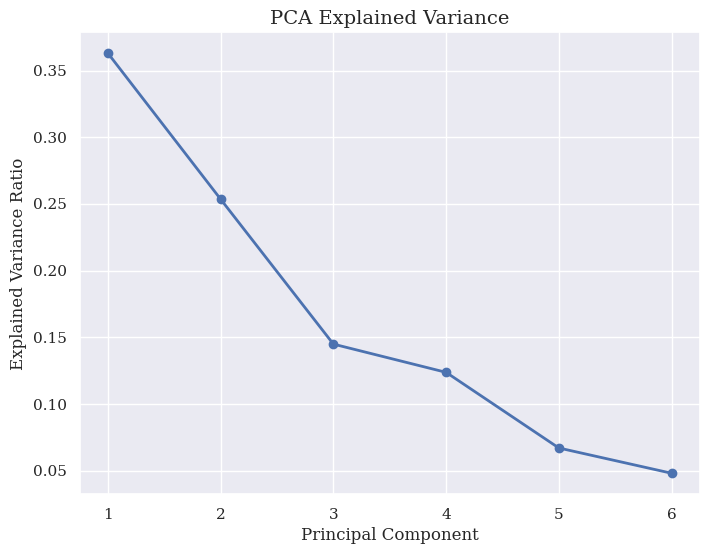

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the theme and specify DejaVu Serif as the font family
sns.set_theme(style="darkgrid", font="DejaVu Serif")

# Create your plot
plt.figure(figsize=(8, 6))

# Plot the explained variance (using the classic Seaborn blue color)
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1),
         pca.explained_variance_ratio_,
         marker='o', linewidth=2, color='#4c72b0')

# Customizations
plt.title('PCA Explained Variance', fontsize=14)
plt.xlabel('Principal Component', fontsize=12)
plt.ylabel('Explained Variance Ratio', fontsize=12)
plt.xticks(range(1, len(pca.explained_variance_ratio_) + 1))

plt.show()

In [19]:
# Breaking at the Elbow!
pca = PCA(n_components=3)
reduced_data = pca.fit_transform(standardized_data_cleaned)

# Convert to a DataFrame for easy mapping
import pandas as pd
df_pca = pd.DataFrame(data=reduced_data, columns=['PC1_Economic_Need', 'PC2_Mobility_Need', 'PC3_Employment_Gap'])

# Add the GEOID column back to df_pca for merging with GeoDataFrame
# The index of standardized_data_cleaned corresponds to the original correlation_data index.
# We need to explicitly reset the index of correlation_data to ensure GEOID is a column
# and then use it to map back to df_pca.
df_pca['GEOID'] = standardized_data_cleaned.index.map(correlation_data['GEOID'])

df_pca

,PC1_Economic_Need,PC2_Mobility_Need,PC3_Employment_Gap,GEOID
0,-2.959713,-2.181423,0.029853,36047000700
1,-2.772549,-2.057166,0.609000,36047000900
2,-1.286207,-3.140199,0.693786,36047001100
3,-0.812337,-0.373188,0.485102,36047001300
4,-0.805820,0.275107,0.023354,36047002000
...,...,...,...,...
769,-1.253291,1.757913,1.553393,36047062000
770,5.300284,0.744337,1.793370,36047080800
771,0.229288,-3.000725,-3.104367,36047123700
772,0.657823,-1.419335,0.565747,36047021100


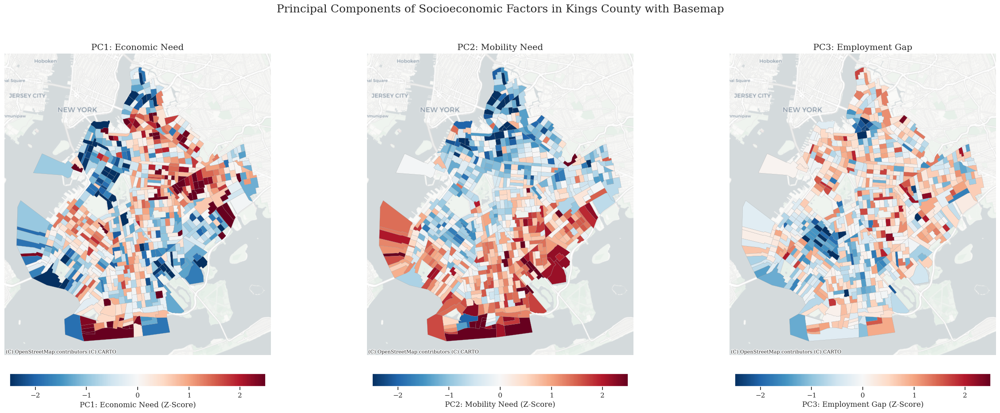

In [20]:
import matplotlib.pyplot as plt
import contextily as ctx

# Create a figure with six subplots in a 2x3 grid and increase the figure size significantly
fig, axes = plt.subplots(1, 3, figsize=(25, 10))
axes = axes.flatten()

# Capturing the bulk of the data between -2.5 and +2.5 standard deviations
vmin_val = -2.5
vmax_val = 2.5
cmap_choice = "RdBu_r"

# Merge df_pca with brooklyn_tracts to get geometry
# Ensure brooklyn_tracts is a GeoDataFrame and has 'GEOID'
gdf_pca = brooklyn_tracts.merge(df_pca, on='GEOID', how='left')

# Plot 1: PC1_Economic_Need
gdf_pca.plot(
    column="PC1_Economic_Need",
    cmap=cmap_choice,
    vmin=vmin_val,
    vmax=vmax_val,
    edgecolor="0.6",
    linewidth=0.2,
    legend=True,
    legend_kwds={
        "label": "PC1: Economic Need (Z-Score)",
        "orientation": "horizontal",
        "pad": 0.05,
        "shrink": 0.7
    },
    ax=axes[0]
)
ctx.add_basemap(axes[0], crs=gdf_pca.crs.to_string(), source=ctx.providers.CartoDB.Positron)
axes[0].set_title("PC1: Economic Need", fontsize=14)
axes[0].axis("off")

# Plot 2: PC2_Mobility_Need
gdf_pca.plot(
    column="PC2_Mobility_Need",
    cmap=cmap_choice,
    vmin=vmin_val,
    vmax=vmax_val,
    edgecolor="0.6",
    linewidth=0.2,
    legend=True,
    legend_kwds={
        "label": "PC2: Mobility Need (Z-Score)",
        "orientation": "horizontal",
        "pad": 0.05,
        "shrink": 0.7
    },
    ax=axes[1]
)
ctx.add_basemap(axes[1], crs=gdf_pca.crs.to_string(), source=ctx.providers.CartoDB.Positron)
axes[1].set_title("PC2: Mobility Need", fontsize=14)
axes[1].axis("off")

# Plot 3: PC3_Employment_Gap
gdf_pca.plot(
    column="PC3_Employment_Gap",
    cmap=cmap_choice,
    vmin=vmin_val,
    vmax=vmax_val,
    edgecolor="0.6",
    linewidth=0.2,
    legend=True,
    legend_kwds={
        "label": "PC3: Employment Gap (Z-Score)",
        "orientation": "horizontal",
        "pad": 0.05,
        "shrink": 0.7
    },
    ax=axes[2]
)
ctx.add_basemap(axes[2], crs=gdf_pca.crs.to_string(), source=ctx.providers.CartoDB.Positron)
axes[2].set_title("PC3: Employment Gap", fontsize=14)
axes[2].axis("off")

plt.suptitle("Principal Components of Socioeconomic Factors in Kings County with Basemap", fontsize=18, y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

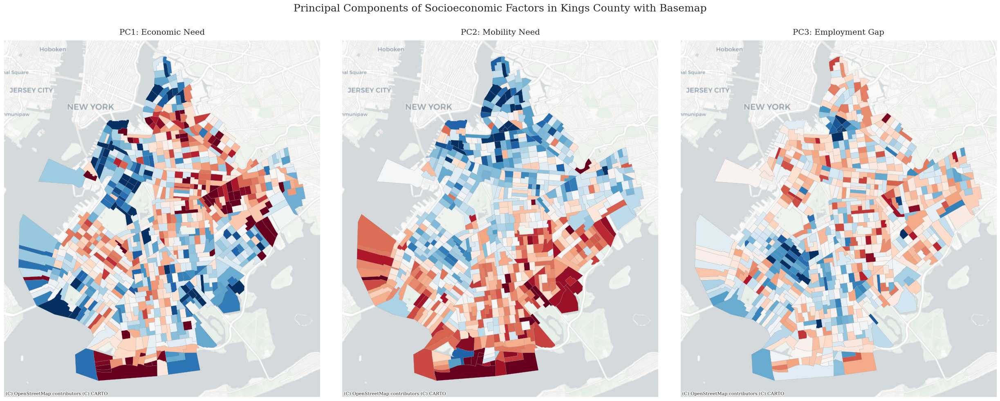

In [21]:
import matplotlib.pyplot as plt
import contextily as ctx
import seaborn as sns

# 1. Apply Seaborn's theme and font configuration
# Using 'white' style so the background is clean for map overlays,
# and specifying 'DejaVu Serif' if desired (or remove font param for default)
sns.set_theme(style="white", font="DejaVu Serif")

# Create a figure with three subplots in a 1x3 grid
fig, axes = plt.subplots(1, 3, figsize=(25, 10))
axes = axes.flatten()

# Capturing the bulk of the data between -2.5 and +2.5 standard deviations
vmin_val = -2.5
vmax_val = 2.5
cmap_choice = "RdBu_r"

# Merge df_pca with brooklyn_tracts to get geometry
gdf_pca = brooklyn_tracts.merge(df_pca, on='GEOID', how='left')

# List of columns and titles to easily loop or keep track of indices
pc_columns = ["PC1_Economic_Need", "PC2_Mobility_Need", "PC3_Employment_Gap"]
pc_titles = ["PC1: Economic Need", "PC2: Mobility Need", "PC3: Employment Gap"]

# --- PLOT LOOPING / GENERATION ---
for i, (col, title) in enumerate(zip(pc_columns, pc_titles)):
    # Plot spatial data using GeoPandas
    gdf_pca.plot(
        column=col,
        cmap=cmap_choice,
        vmin=vmin_val,
        vmax=vmax_val,
        edgecolor="0.6",
        linewidth=0.2,
        ax=axes[i]
    )

    # Add contextily basemap
    ctx.add_basemap(axes[i], crs=gdf_pca.crs.to_string(), source=ctx.providers.CartoDB.Positron)

    # Titles and formatting
    axes[i].set_title(title, fontsize=14, pad=10)
    axes[i].axis("off")

# Final adjustments
plt.suptitle("Principal Components of Socioeconomic Factors in Kings County with Basemap", fontsize=18, y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

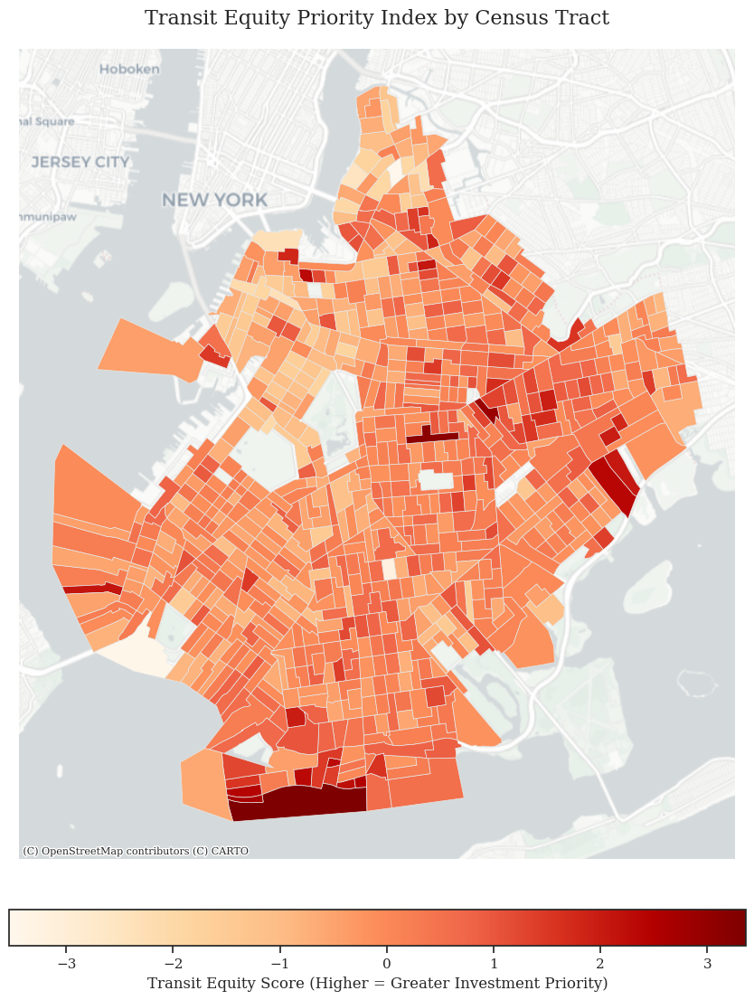

In [22]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import contextily as ctx

# 1. Use the pre-existing gdf_pca which contains the spatial data and PC scores
gdf = gdf_pca.copy()

# 2. Calculate the weighted Transit Equity Score using the correct PC column names
gdf['Transit_Equity_Score'] = (
    (0.477 * gdf['PC1_Economic_Need']) +
    (0.331 * gdf['PC2_Mobility_Need']) +
    (0.192 * gdf['PC3_Employment_Gap'])
)

# 3. Plot the Choropleth Map
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

# We use the 'OrRd' (Orange-Red) colormap so higher priority areas stand out vividly
gdf.plot(
    column='Transit_Equity_Score',
    cmap='OrRd',
    linewidth=0.5,
    ax=ax,
    edgecolor='0.9',
    legend=True,
    legend_kwds={
        'label': "Transit Equity Score (Higher = Greater Investment Priority)",
        'orientation': "horizontal",
        'pad': 0.05,
        'shrink': 0.7
    }
)

ctx.add_basemap(ax, crs=gdf_pca.crs.to_string(), source=ctx.providers.CartoDB.Positron)

# Clean up the map appearance
ax.set_title('Transit Equity Priority Index by Census Tract', fontsize=16, pad=20)
ax.axis('off')

# Display the plot
plt.tight_layout()
plt.show()

In [23]:
# Export the finished equity score dataframe
gdf.to_parquet("/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/gdf_transit_equity_score.parquet")
print("Exported gdf with Transit_Equity_Score to Drive")

Exported gdf with Transit_Equity_Score to Drive


# **Phase II: LEHD job data and GTFS data**

Standard LEHD dataset import code module.

Referenced from: https://lehd.ces.census.gov/data/lehd-code-samples/sections/lodes/basic_examples.html

In [24]:
import pandas as pd


def read_lodes_data(
    data_type,
    state,
    segment,
    job_type,
    year,
    main=True,
    base="https://lehd.ces.census.gov/data/lodes/LODES8/",
):
    """
    Reads LODES RAC, WAC, or OD data based on the specified type.

    Parameters:
    - data_type (str): One of 'rac', 'wac', or 'od' to specify the dataset.
    - state (str): Lowercase two-character state abbreviation (e.g., 'nj').
    - segment (str): Segment type (e.g., 'SA01'). Ignored if 'data_type' is 'od'.
    - job_type (str): Job type (e.g., 'JT00').
    - year (int): Year of data (e.g., 2004).
    - main (bool): Whether to read the 'main' file type. Only used if 'data_type' is 'od'.
    - base (str): Base file path to read data from. Can be URL or local file path.

    Returns:
    - pd.DataFrame: The requested LODES dataset as a pandas DataFrame.
    """
    if data_type not in ["rac", "wac", "od"]:
        raise ValueError("Invalid data type. Choose from 'rac', 'wac', or 'od'.")
    if data_type == "od":
        if main:
            file_url = f"{base}{state}/od/{state}_od_main_{job_type}_{year}.csv.gz"
        else:
            file_url = f"{base}{state}/od/{state}_od_aux_{job_type}_{year}.csv.gz"
        dtype_mapping = {"h_geocode": str, "w_geocode": str}
    else:
        file_url = f"{base}{state}/{data_type}/{state}_{data_type}_{segment}_{job_type}_{year}.csv.gz"
        dtype_mapping = {"h_geocode": str} if data_type == "rac" else {"w_geocode": str}

    return pd.read_csv(file_url, dtype=dtype_mapping)

Standard LEHD crosswalk dataset import code module.

Referenced from: https://lehd.ces.census.gov/data/lehd-code-samples/sections/lodes/basic_examples.html

In [25]:
import pandas as pd


def read_crosswalk(
    state, cols="all", base="https://lehd.ces.census.gov/data/lodes/LODES8/"
):
    """
    Reads LODES Geography Crosswalk given state.

    Parameters:
    - state (str): Lowercase two-character state abbreviation (e.g., 'nj').
    - cols (list): List of columns to read from the crosswalk in addition to tabblk2020 (Block ID). If "all", all columns will be read and returned.
    - base (str): Base file path to read data from. Can be URL or local file path.

    Returns:
    - pd.DataFrame: The requested LODES crosswalk as a pandas DataFrame.
    """
    file_url = f"{base}{state}/{state}_xwalk.csv.gz"
    dtype_mapping = str
    if cols == "all":
        return pd.read_csv(file_url, dtype=dtype_mapping)
    cols.insert(0, "tabblk2020")
    return pd.read_csv(file_url, dtype=dtype_mapping, usecols=cols)

In [26]:
# Extracting lodes data
# wac = workplace area characteristics
# ny = abbreviation for new york
# S000 = all jobs
# JT00 = all job type
# 2023 = latest year of data available

job_data = read_lodes_data('wac', 'ny', 'S000', 'JT00', 2023)
print(job_data.head())

         w_geocode  C000  CA01  CA02  CA03  CE01  CE02  CE03  CNS01  CNS02  \
0  360010001001003     7     0     5     2     0     0     7      0      0   
1  360010001001004    52     8    38     6     0     5    47      0      0   
2  360010001001005    77    10    43    24     1     9    67      0      0   
3  360010001001006    43     8    26     9     3     4    36      0      0   
4  360010001001007   149    18    85    46     9    40   100      0      0   

   ...  CFA02  CFA03  CFA04  CFA05  CFS01  CFS02  CFS03  CFS04  CFS05  \
0  ...      0      0      0      0      0      0      0      0      0   
1  ...      0      0      0      0      0      0      0      0      0   
2  ...      0      0      0      0      0      0      0      0      0   
3  ...      0      0      0      0      0      0      0      0      0   
4  ...      0      0      0      0      0      0      0      0      0   

   createdate  
0    20251202  
1    20251202  
2    20251202  
3    20251202  
4    2025120

In [27]:
crosswalk = read_crosswalk('ny', cols=['cty', 'ctyname'])
print(crosswalk.head())

        tabblk2020    cty            ctyname
0  360010001001000  36001  Albany County, NY
1  360010001001001  36001  Albany County, NY
2  360010001001002  36001  Albany County, NY
3  360010001001003  36001  Albany County, NY
4  360010001001004  36001  Albany County, NY


### Geocode break down:

geocode: 360470001001004

36 : State ID

047 : County ID

000100 : Census Tract ID

1004 : Census Block ID

Let's create two new variables:

`kings_tract_jobs` : Contains all tract ID of Brooklyn along with the no. of total jobs available in each track.

`nyc_tract_jobs` : Contains all tract ID of NYC (Bronx, Brooklyn, Manhattan, Queens and Staten Island) along with the no. of total jobs available in each track.

In [28]:
# Creating a new column with only state and county ID
job_data['cty_code'] = job_data['w_geocode'].str[:5]

# Setting up the IDs for destination counties
nyc_counties = {
    "Bronx": "36005",
    "Brooklyn": "36047",
    "Manhattan": "36061",
    "Queens": "36081",
    "Staten Island": "36085"
}

# New dataframe with the geocodes having only kings county
kings_wac = job_data[job_data['cty_code'] == '36047'].copy()

kings_wac['tract_id'] = kings_wac['w_geocode'].str[:11]

kings_tract_jobs = (
    kings_wac.groupby('tract_id', as_index=False)
    .agg(total_jobs = ('C000', 'sum'))
)

# New dataframe with the geocode having all NYC counties
nyc_wac = job_data[job_data['cty_code'].isin(nyc_counties.values())].copy()
nyc_wac['tract_id'] = nyc_wac['w_geocode'].str[:11]

nyc_tract_jobs = (
    nyc_wac.groupby('tract_id', as_index=False)
    .agg(total_jobs = ('C000', 'sum'))
)

In [29]:
kings_tract_jobs.head()

,tract_id,total_jobs
0,36047000100,899
1,36047000200,4381
2,36047000301,1106
3,36047000501,655
4,36047000502,1665


In [30]:
# filter out the tracts in the main tract GPD
common_kings_tracts = brooklyn_tracts[brooklyn_tracts['GEOID'].isin(common_geoids)]

# merge the kings job data to the main tract GPD
kings_tract_jobs = common_kings_tracts.merge(kings_tract_jobs, left_on='GEOID', right_on='tract_id', how='left')

In [31]:
import pygris

nyc_tracts = pygris.tracts(state="NY", county=["Bronx", "Kings", "New York", "Queens", "Richmond"], year=2023)

Using FIPS code '36' for input 'NY'
Using FIPS code '005' for input 'Bronx'
Using FIPS code '047' for input 'Kings'
Using FIPS code '061' for input 'New York'
Using FIPS code '081' for input 'Queens'
Using FIPS code '085' for input 'Richmond'


In [32]:
nyc_tract_jobs = nyc_tracts.merge(
    nyc_tract_jobs,  # your existing DataFrame with tract_id and total_jobs
    left_on="GEOID",
    right_on="tract_id",
    how="left"
)

print(nyc_tract_jobs.crs)
print(nyc_tract_jobs.shape)

EPSG:4269
(2327, 16)


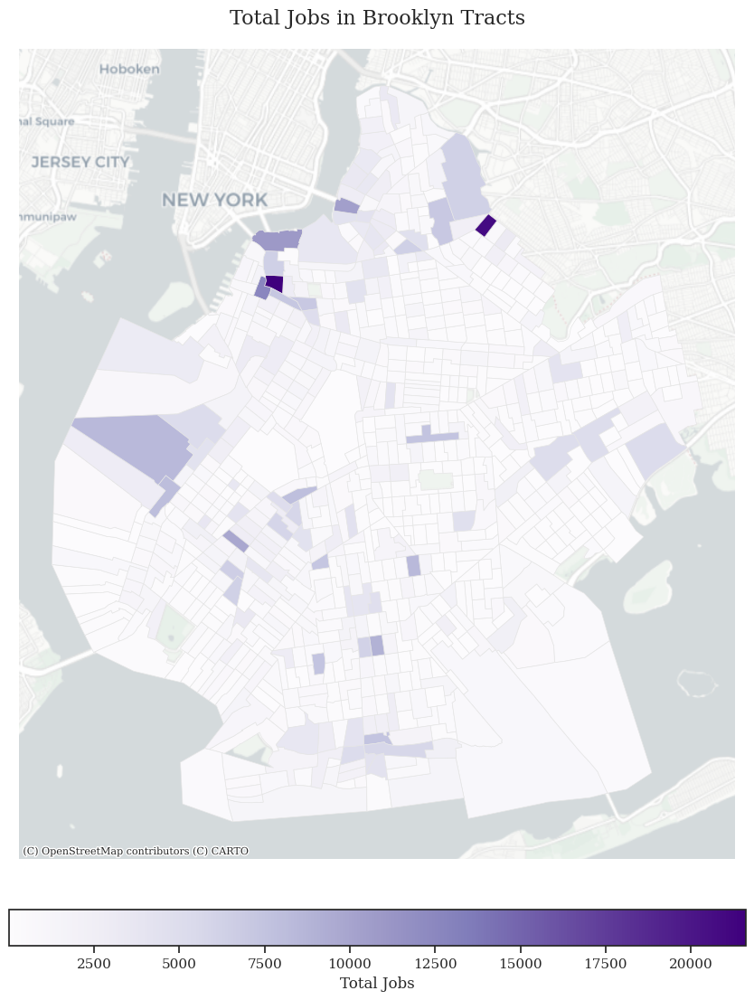

In [33]:
# plot the cloropleth of the tract_job gdf
import matplotlib.pyplot as plt
import contextily as ctx
import seaborn as sns

fig, ax = plt.subplots(1, 1, figsize=(12, 12))

kings_tract_jobs.plot(
    column='total_jobs',
    cmap='Purples',
    linewidth=0.5,
    ax=ax,
    edgecolor='0.9',
    legend=True,
    legend_kwds={
        'label': "Total Jobs",
        'orientation': "horizontal",
        'pad': 0.05,
        'shrink': 0.7
    }
)

ctx.add_basemap(ax, crs=kings_tract_jobs.crs.to_string(), source=ctx.providers.CartoDB.Positron)

ax.set_title('Total Jobs in Brooklyn Tracts', fontsize=16, pad=20)
ax.axis('off')

plt.tight_layout()
plt.show()

In [34]:
# calculating centroid of geoids
kings_tract_jobs['CENTROID'] = (kings_tract_jobs.to_crs(epsg=3857)
                          .geometry.centroid
                          .to_crs(kings_tract_jobs.crs)
                          )

tract_centroid = kings_tract_jobs[['tract_id', 'CENTROID', 'total_jobs']]

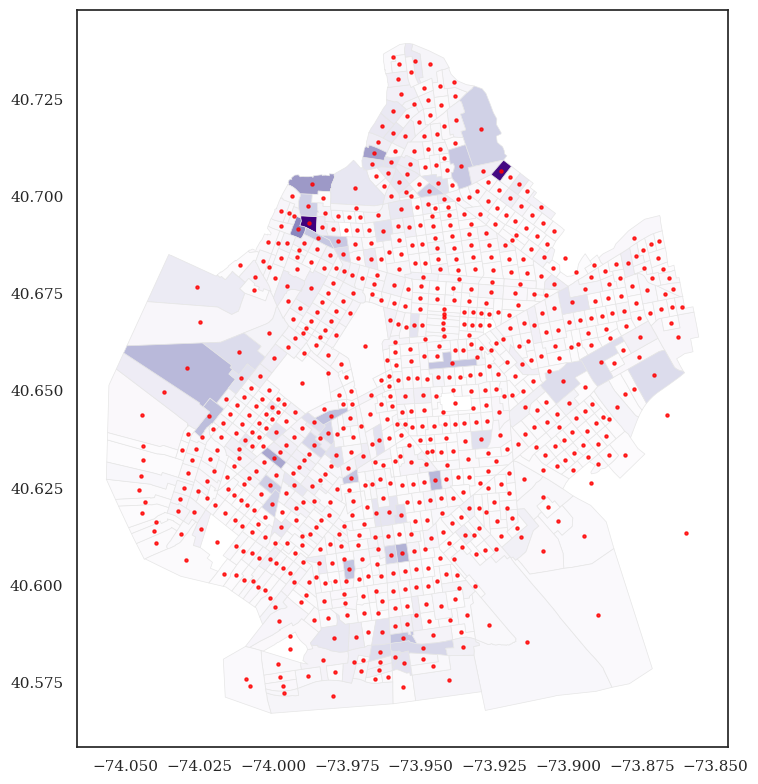

In [35]:
# Visualize centroid on their respective tracts
import matplotlib.pyplot as plt
import contextily as ctx

fig, ax = plt.subplots(1, 1, figsize=(8, 8))

# 1. Plot the tracts (polygons)
kings_tract_jobs.plot(
    column='total_jobs',
    cmap='Purples',
    linewidth=0.5,
    ax=ax,
    edgecolor='0.9',
    legend=False,
    legend_kwds={
        'label': "Total Jobs",
        'orientation': "horizontal",
        'pad': 0.05,
        'shrink': 0.7
    })

# 2. Overlay tract centroids as points on the tract
# We temporarily set the geometry to 'CENTROID' just for this plot call
kings_tract_jobs.set_geometry('CENTROID').plot(
    ax=ax,
    color='red',  # Pick a color that pops against the purple
    markersize=5,       # Adjust size as needed
    alpha=0.8,
)

plt.tight_layout()
plt.show()

In [36]:
# Export as GeoParquet — preserves geometry column natively
nyc_tract_jobs.to_parquet("/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/nyc_tract_jobs.parquet")
kings_tract_jobs.to_parquet("/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/kings_tract_jobs.parquet")

print("Exported nyc_tract_jobs and kings_tract_jobs to Drive")

Exported nyc_tract_jobs and kings_tract_jobs to Drive


In [37]:
import geopandas as gpd

# load back nyc_tract_jobs and kings_tract_jobs to their original name
nyc_tract_jobs = gpd.read_parquet("/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/nyc_tract_jobs.parquet")
kings_tract_jobs = gpd.read_parquet("/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/kings_tract_jobs.parquet")

# Setting Up r5py

In [38]:
import os

# 1. Force non-interactive installation and remove the silent flags to monitor progress
!DEBIAN_FRONTEND=noninteractive apt-get update
!DEBIAN_FRONTEND=noninteractive apt-get install -y openjdk-21-jdk

# 2. Set update-alternatives
!update-alternatives --install /usr/bin/java java /usr/lib/jvm/java-21-openjdk-amd64/bin/java 100
!update-alternatives --install /usr/bin/javac javac /usr/lib/jvm/java-21-openjdk-amd64/bin/javac 100
!update-alternatives --set java /usr/lib/jvm/java-21-openjdk-amd64/bin/java
!update-alternatives --set javac /usr/lib/jvm/java-21-openjdk-amd64/bin/javac

# 3. Configure Environment Variables
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-21-openjdk-amd64"
os.environ["PATH"] = os.environ["JAVA_HOME"] + "/bin:" + os.environ["PATH"]

# 4. Verify
!java -version

Get:1 https://cli.github.com/packages stable InRelease [3,917 B]
Get:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:3 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:4 https://cli.github.com/packages stable/main amd64 Packages [356 B]
Get:5 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ Packages [102 kB]
Get:6 https://r2u.stat.illinois.edu/ubuntu jammy/main all Packages [10.6 MB]
Get:7 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease [18.1 kB]
Hit:8 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:9 https://r2u.stat.illinois.edu/ubuntu jammy/main amd64 Packages [3,148 kB]
Get:10 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy/main amd64 Packages [43.4 kB]
Hit:11 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:12 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:13 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Get

In [39]:
!java -version

[0.001s][warning][os,container] Cgroup memory controller path at '/sys/fs/cgroup' seems to have moved to '/../../jupyter-children', detected limits won't be accurate
[0.002s][warning][os,container] Cgroup cpu controller path at '/sys/fs/cgroup' seems to have moved to '/../../jupyter-children', detected limits won't be accurate
openjdk version "21.0.11" 2026-04-21
OpenJDK Runtime Environment (build 21.0.11+10-1-22.04.2-Ubuntu)
OpenJDK 64-Bit Server VM (build 21.0.11+10-1-22.04.2-Ubuntu, mixed mode, sharing)


In [40]:
import os

# Install Java 21 (if not already installed)
!apt-get update -qq
!apt-get install -y openjdk-21-jdk

# Set Java 21 as the default Java version using update-alternatives
# Giving a high priority (e.g., 100) to ensure it takes precedence
!update-alternatives --install /usr/bin/java java /usr/lib/jvm/java-21-openjdk-amd64/bin/java 100
!update-alternatives --install /usr/bin/javac javac /usr/lib/jvm/java-21-openjdk-amd64/bin/javac 100
!update-alternatives --set java /usr/lib/jvm/java-21-openjdk-amd64/bin/java
!update-alternatives --set javac /usr/lib/jvm/java-21-openjdk-amd64/bin/javac

os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-21-openjdk-amd64"
# Correcting PATH to include the 'bin' directory of JAVA_HOME
os.environ["PATH"] = os.environ["JAVA_HOME"] + "/bin:" + os.environ["PATH"]

# Verify Java version immediately after setup
!java -version

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
openjdk-21-jdk is already the newest version (21.0.11+10-1~22.04.2).
0 upgraded, 0 newly installed, 0 to remove and 135 not upgraded.
[0.001s][warning][os,container] Cgroup memory controller path at '/sys/fs/cgroup' seems to have moved to '/../../jupyter-children', detected limits won't be accurate
[0.001s][warning][os,container] Cgroup cpu controller path at '/sys/fs/cgroup' seems to have moved to '/../../jupyter-children', detected limits won't be accurate
openjdk version "21.0.11" 2026-04-21
OpenJDK Runtime Environment (build 21.0.11+10-1-22.04.2-Ubuntu)
OpenJDK 64-Bit Server VM (build 21.0.11+10-1-22.04.2-Ubuntu, mixed mode, sharing)


In [41]:
!pip install r5py

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.8/63.8 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 438.5/438.5 kB 27.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 290.1/290.1 kB 24.2 MB/s eta 0:00:00


In [42]:
import r5py
print(r5py.__version__)
print(r5py.TransportNetwork)

1.1.7
<class 'r5py.r5.transport_network.TransportNetwork'>


In [43]:
import r5py
print(r5py.__version__)
print(r5py.__file__)

1.1.7
/usr/local/lib/python3.12/dist-packages/r5py/__init__.py


In [44]:
import os
r5py_cache = os.path.expanduser("~/.cache/r5py")
print(os.listdir(r5py_cache))

['r5-v7.5.1-r5py-all.jar']


In [45]:
# !apt-get install -y osmium-tool

### Installing Osmium to filter out data by geographrical boundary, transit modes and then save the cropped data to Drive. (This will only be done once)

### Now let's take the larger OSM Network file `new-york-260628.osm.pbf` and then crop the network with a geographical boundary and then save the cropped file as `nyc_cropped.osm.pbf` so that we only retain the geometry that is necessary and unnecessary networks are not loaded slowing down the calculations.

In [46]:
# !osmium extract \
#   --bbox -74.26,40.495,-73.70,40.915 \
#   "/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/OSM/new-york-260628.osm.pbf" \
#   -o "/content/nyc_cropped.osm.pbf"

In [47]:
# !osmium tags-filter \
#   "/content/nyc_cropped.osm.pbf" \
#   w/highway w/public_transport w/railway=platform w/route=ferry \
#   n/highway n/public_transport n/railway \
#   -o "/content/nyc_routable.osm.pbf"

In [48]:
# !ls -lh "/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/OSM/new-york-260628.osm.pbf" \
#         "/content/nyc_cropped.osm.pbf" \
#         "/content/nyc_routable.osm.pbf"

In [49]:
# !cp "/content/nyc_routable.osm.pbf" \
#     "/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/OSM/nyc_routable.osm.pbf"

In [50]:
import r5py
import pandas as pd
import geopandas as gpd
from datetime import datetime

In [51]:
import os

# Check what's in r5py cache
print("=== r5py cache contents ===")
print(os.listdir("/root/.cache/r5py"))

# Check if the cache itself is a symlink
print("\n=== Is cache a symlink? ===")
print(os.path.islink("/root/.cache/r5py"))
if os.path.islink("/root/.cache/r5py"):
    print("Points to:", os.readlink("/root/.cache/r5py"))

# Check if the GTFS files are symlinks
print("\n=== GTFS file status ===")
gtfs_path = "/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/GTFS"
for f in os.listdir(gtfs_path):
    full = os.path.join(gtfs_path, f)
    if os.path.islink(full):
        print(f"{f} → symlink → {os.readlink(full)}")
    else:
        print(f"{f} → real file")

=== r5py cache contents ===
['r5-v7.5.1-r5py-all.jar']

=== Is cache a symlink? ===
False

=== GTFS file status ===
subway.zip → real file
brooklyn_bus.zip → real file
manhattan_bus.zip → real file
queens_bus.zip → real file
bronx_bus.zip → real file


In [52]:
# transport_network = r5py.TransportNetwork(
#     osm_pbf="/root/.cache/r5py/nyc_routable.osm.pbf",
#     gtfs=[
#         "/root/.cache/r5py/bronx_bus.zip",
#         "/root/.cache/r5py/brooklyn_bus.zip",
#         "/root/.cache/r5py/manhattan_bus.zip",
#         "/root/.cache/r5py/queens_bus.zip",
#         "/root/.cache/r5py/subway.zip",
#     ]
# )

### Saving the cached `transport_network` on Google drive so we don't have to run the time consuming code everytime the runtime resets

In [53]:
# import shutil
# import os

# src = os.path.expanduser("~/.cache/r5py")
# dst = "/content/drive/MyDrive/Colab Notebooks/Project Dream/r5py_cache_backup"

# shutil.copytree(src, dst, dirs_exist_ok=True)
# print("Cache backed up to Drive")

### We now run this code to retrieve the saved `transport network` from the Drive

Disclaimer: The two codes of blocks above have now been commented out because they have been computed once and are now saved on the drive. The code following is to be used.

In [54]:
import shutil
import os

src = "/content/drive/MyDrive/Colab Notebooks/Project Dream/r5py_cache_backup"
dst = os.path.expanduser("~/.cache/r5py")

os.makedirs(dst, exist_ok=True)
shutil.copytree(src, dst, dirs_exist_ok=True)
print("Cache restored from Drive")

Cache restored from Drive


Let's load the network from the cache back to `transport_network`

In [55]:
import os
import glob

cache_dir = os.path.expanduser("~/.cache/r5py")

# Find and remove any .mapdb files (these are the corrupted intermediate index files)
mapdb_files = glob.glob(os.path.join(cache_dir, "*.mapdb*"))
print("Found mapdb files:", mapdb_files)

for f in mapdb_files:
    os.remove(f)
    print(f"Removed: {f}")

Found mapdb files: ['/root/.cache/r5py/f7f5e1b757f61243ed56ab15c2d4f1bf05fb6304c54e41f5403a1121f72b3e83.mapdb', '/root/.cache/r5py/f7f5e1b757f61243ed56ab15c2d4f1bf05fb6304c54e41f5403a1121f72b3e83.mapdb.p']
Removed: /root/.cache/r5py/f7f5e1b757f61243ed56ab15c2d4f1bf05fb6304c54e41f5403a1121f72b3e83.mapdb
Removed: /root/.cache/r5py/f7f5e1b757f61243ed56ab15c2d4f1bf05fb6304c54e41f5403a1121f72b3e83.mapdb.p


In [ ]:
transport_network = r5py.TransportNetwork(
    osm_pbf="/root/.cache/r5py/nyc_routable.osm.pbf",
    gtfs=[
        "/root/.cache/r5py/bronx_bus.zip",
        "/root/.cache/r5py/brooklyn_bus.zip",
        "/root/.cache/r5py/queens_bus.zip",
        "/root/.cache/r5py/manhattan_bus.zip",
        "/root/.cache/r5py/subway.zip",
    ],
)

In [56]:
# Origins — Kings County tract centroids
origins = kings_tract_jobs[["GEOID", "geometry"]].copy()
origins = origins.to_crs(epsg=32618)  # UTM Zone 18N, appropriate for NYC
origins["geometry"] = origins.geometry.centroid
origins = origins.to_crs(epsg=4326)
origins = origins.rename(columns={"GEOID": "id"})

# Destinations — All NYC tract centroids
destinations = nyc_tract_jobs[["GEOID", "geometry"]].copy()
destinations = destinations.to_crs(epsg=32618)
destinations["geometry"] = destinations.geometry.centroid
destinations = destinations.to_crs(epsg=4326)
destinations = destinations.rename(columns={"GEOID": "id"})

print(f"Origins: {len(origins)} tracts")
print(f"Destinations: {len(destinations)} tracts")

Origins: 805 tracts
Destinations: 2327 tracts


In [57]:
print(dir(r5py))
print(r5py.__version__)

['DetailedItineraries', 'ElevationCostFunction', 'Isochrones', 'RegionalTask', 'TransportMode', 'TransportNetwork', 'TravelTimeMatrix', '__all__', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', '__version__', 'r5', 'util']
1.1.7


### **Let's check the validity of the GTFS calendar for the target dates**

In [58]:
import zipfile
import pandas as pd
import io

gtfs_files = [
    "/root/.cache/r5py/bronx_bus.zip",
    "/root/.cache/r5py/brooklyn_bus.zip",
    "/root/.cache/r5py/queens_bus.zip",
    "/root/.cache/r5py/manhattan_bus.zip",
    "/root/.cache/r5py/subway.zip",
]

# Dates you're planning to use (weekday + weekend)
target_dates = ["20260714", "20260718"]  # Tue Jul 14, Sat Jul 18 2026

for path in gtfs_files:
    print(f"\n--- {path} ---")
    with zipfile.ZipFile(path) as z:
        if "calendar.txt" in z.namelist():
            df = pd.read_csv(io.BytesIO(z.read("calendar.txt")), dtype=str)
            start, end = df["start_date"].min(), df["end_date"].max()
            print(f"calendar.txt valid range: {start} to {end}")
            for d in target_dates:
                valid = start <= d <= end
                print(f"  {d} within range: {valid}")
        if "calendar_dates.txt" in z.namelist():
            df = pd.read_csv(io.BytesIO(z.read("calendar_dates.txt")), dtype=str)
            print(f"calendar_dates.txt covers dates: {df['date'].min()} to {df['date'].max()}")
            for d in target_dates:
                exception = df[df["date"] == d]
                if not exception.empty:
                    print(f"  {d} has a service exception: exception_type={exception['exception_type'].tolist()}")


--- /root/.cache/r5py/bronx_bus.zip ---
calendar.txt valid range: 20260627 to 20260905
  20260714 within range: True
  20260718 within range: True
calendar_dates.txt covers dates: 20260628 to 20260904

--- /root/.cache/r5py/brooklyn_bus.zip ---
calendar.txt valid range: 20260627 to 20260905
  20260714 within range: True
  20260718 within range: True
calendar_dates.txt covers dates: 20260630 to 20260819
  20260714 has a service exception: exception_type=['2', '2', '2', '2', '2', '2', '2']

--- /root/.cache/r5py/queens_bus.zip ---
calendar.txt valid range: 20260627 to 20260905
  20260714 within range: True
  20260718 within range: True
calendar_dates.txt covers dates: 20260628 to 20260904

--- /root/.cache/r5py/manhattan_bus.zip ---
calendar.txt valid range: 20260627 to 20260905
  20260714 within range: True
  20260718 within range: True
calendar_dates.txt covers dates: 20260628 to 20260904

--- /root/.cache/r5py/subway.zip ---
calendar.txt valid range: 20260526 to 20260907
  20260714 w

In [ ]:
from datetime import datetime, timedelta
import pandas as pd
import os

departure_scenarios = {
    "am_peak_weekday":    datetime(2026, 7, 14, 8, 0, 0),
    "midday_weekday":     datetime(2026, 7, 14, 12, 0, 0),
    "pm_peak_weekday":    datetime(2026, 7, 14, 17, 30, 0),
    "evening_weekday":    datetime(2026, 7, 14, 21, 0, 0),
    "weekend_midday":     datetime(2026, 7, 18, 12, 0, 0),
    "late_night_weekday": datetime(2026, 7, 14, 0, 0, 0),
}

output_dir = "/content/drive/MyDrive/Colab Notebooks/Project Dream/Data"
os.makedirs(output_dir, exist_ok=True)

results_summary = []

for scenario_name, departure_time in departure_scenarios.items():
    filename = f"travel_time_matrix_{scenario_name}_{departure_time.strftime('%Y%m%d_%H%M')}.parquet"
    filepath = os.path.join(output_dir, filename)

    # Skip if already computed (checkpoint/resume support)
    if os.path.exists(filepath):
        print(f"Skipping {scenario_name} — already exists at {filepath}")
        continue

    print(f"\nComputing: {scenario_name} — {departure_time}")

    tt_computer = r5py.TravelTimeMatrix(
        transport_network,
        origins=origins,
        destinations=destinations,
        departure=departure_time,
        departure_time_window=timedelta(hours=1),
        max_time=timedelta(minutes=45),
        transport_modes=[r5py.TransportMode.TRANSIT, r5py.TransportMode.WALK],
    )

    tt_computer.to_parquet(filepath)

    n_total = len(tt_computer)
    n_reachable = tt_computer["travel_time"].notna().sum()
    results_summary.append({
        "scenario": scenario_name,
        "departure": departure_time,
        "filename": filename,
        "total_pairs": n_total,
        "reachable_pairs": n_reachable,
        "pct_reachable": round(100 * n_reachable / n_total, 2),
        "mean_travel_time": round(tt_computer["travel_time"].mean(), 2),
    })

    print(f"Saved: {filepath} ({n_reachable}/{n_total} reachable, {100*n_reachable/n_total:.1f}%)")

if results_summary:
    summary_df = pd.DataFrame(results_summary)
    print("\nSUMMARY")
    print(summary_df.to_string(index=False))
    summary_df.to_csv(os.path.join(output_dir, "travel_time_matrix_scenarios_summary.csv"), index=False)

Skipping am_peak_weekday — already exists at /content/drive/MyDrive/Colab Notebooks/Project Dream/Data/travel_time_matrix_am_peak_weekday_20260714_0800.parquet
Skipping midday_weekday — already exists at /content/drive/MyDrive/Colab Notebooks/Project Dream/Data/travel_time_matrix_midday_weekday_20260714_1200.parquet
Skipping pm_peak_weekday — already exists at /content/drive/MyDrive/Colab Notebooks/Project Dream/Data/travel_time_matrix_pm_peak_weekday_20260714_1730.parquet
Skipping evening_weekday — already exists at /content/drive/MyDrive/Colab Notebooks/Project Dream/Data/travel_time_matrix_evening_weekday_20260714_2100.parquet
Skipping weekend_midday — already exists at /content/drive/MyDrive/Colab Notebooks/Project Dream/Data/travel_time_matrix_weekend_midday_20260718_1200.parquet
Skipping late_night_weekday — already exists at /content/drive/MyDrive/Colab Notebooks/Project Dream/Data/travel_time_matrix_late_night_weekday_20260714_0000.parquet


### Combining all departure times into one long format travel time matrix and saving it

In [ ]:
# import pandas as pd
# import os
# import glob

# output_dir = "/content/drive/MyDrive/Colab Notebooks/Project Dream/Data"

# # Grab all six scenario files
# matrix_files = glob.glob(os.path.join(output_dir, "travel_time_matrix_*.parquet"))
# matrix_files = [f for f in matrix_files if "raw" not in f]  # exclude your earlier raw/9pm files if still present

# dfs = []
# for f in matrix_files:
#     scenario_name = os.path.basename(f).replace("travel_time_matrix_", "").rsplit("_", 2)[0]
#     df = pd.read_parquet(f)
#     df["scenario"] = scenario_name
#     dfs.append(df)

# long_df = pd.concat(dfs, ignore_index=True)
# print(long_df.shape)
# print(long_df["scenario"].value_counts())

# long_df.to_parquet(os.path.join(output_dir, "travel_time_matrix_long_format.parquet"))
# print("Saved long-format matrix")

## Data calculated and Exported

In [59]:
# Run this to give me a quick snapshot
print(kings_tract_jobs.columns.tolist())
print(gdf.columns.tolist())

['STATEFP', 'COUNTYFP', 'TRACTCE', 'GEOID', 'NAME', 'NAMELSAD', 'MTFCC', 'FUNCSTAT', 'ALAND', 'AWATER', 'INTPTLAT', 'INTPTLON', 'geometry', 'tract_id', 'total_jobs', 'CENTROID']
['STATEFP', 'COUNTYFP', 'TRACTCE', 'GEOID', 'NAME', 'NAMELSAD', 'MTFCC', 'FUNCSTAT', 'ALAND', 'AWATER', 'INTPTLAT', 'INTPTLON', 'geometry', 'PC1_Economic_Need', 'PC2_Mobility_Need', 'PC3_Employment_Gap', 'Transit_Equity_Score']


In [63]:
import pandas as pd

# Loading the job accessibility data we calculated before
job_accessibility = pd.read_parquet(
    "/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/travel_time_matrix_am_peak_weekday_20260714_0800.parquet"
)

In [64]:
# Filter out any travel times exceeding the 45-minute cap
job_accessibility = job_accessibility[job_accessibility["travel_time"] <= 45].copy()

In [65]:
print(job_accessibility.head())

         from_id        to_id  travel_time
20   36047000700  36047021100         39.0
53   36047000700  36047123700         40.0
214  36047000700  36047088002         41.0
216  36047000700  36047006901         19.0
217  36047000700  36047006902         22.0


In [66]:
# 1. Merge job counts onto destination tracts (using the filtered matrix)
job_accessibility_merged = job_accessibility.merge(
    nyc_tract_jobs[["tract_id", "total_jobs"]].rename(columns={"tract_id": "to_id"}),
    on="to_id",
    how="left"
)

# Fill any unmatched destinations (e.g. non-populated tracts, split-tract gaps) with 0 jobs
job_accessibility_merged["total_jobs"] = job_accessibility_merged["total_jobs"].fillna(0)

# 2. Sum accessible jobs per origin tract
reachable_jobs = (
    job_accessibility_merged.groupby("from_id")["total_jobs"]
    .sum()
    .reset_index()
    .rename(columns={"from_id": "GEOID", "total_jobs": "reachable_jobs"})
)

print(reachable_jobs.shape)
print(reachable_jobs.head(10))

(805, 2)
         GEOID  reachable_jobs
0  36047000100       2710946.0
1  36047000200        436229.0
2  36047000301       2361291.0
3  36047000501       2694574.0
4  36047000502       2775317.0
5  36047000700       2157255.0
6  36047000900       2949123.0
7  36047001100       3007472.0
8  36047001300       2538889.0
9  36047001501       2340720.0


In [67]:
import geopandas as gpd

# Load the gdf variable from the parquet file
gdf = gpd.read_parquet("/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/gdf_transit_equity_score.parquet")

# Join job accessibility to the main GDF
gdf = gdf.merge(
    reachable_jobs[["GEOID", "reachable_jobs"]],
    on="GEOID",
    how="left"
)

print(gdf.shape)
print(gdf[["GEOID", "Transit_Equity_Score", "reachable_jobs"]].head())
print(gdf["reachable_jobs"].isna().sum(), "tracts missing job accessibility")

(805, 18)
         GEOID  Transit_Equity_Score  reachable_jobs
0  36047000700             -2.128103       2157255.0
1  36047000900             -1.886500       2949123.0
2  36047001100             -1.519720       3007472.0
3  36047001300             -0.417870       2538889.0
4  36047002000             -0.288832        391772.0
0 tracts missing job accessibility


In [68]:
# Checking correlation between need and access
from scipy import stats

gdf_clean = gdf.dropna(subset=["Transit_Equity_Score", "reachable_jobs"])
print(f"Tracts after dropping NaN: {len(gdf_clean)}")

r, p = stats.pearsonr(gdf_clean["Transit_Equity_Score"], gdf_clean["reachable_jobs"])
print(f"Pearson r: {r:.3f}")
print(f"p-value: {p:.2e}")

Tracts after dropping NaN: 774
Pearson r: -0.300
p-value: 1.58e-17


# Person Coefficient Result Interpretation
Since Pearson's = -0.3, there's a negative corelation meaning tracts with higher transit equity needs can reach fewer jobs within 45 minutes.

Also, p < 0.0001. This means that the relationship is statistically significant and not a chance finding.

The magnitude of the Pearson's r is 'moderate', meaning transit need explains about 9% of the variance in job accessibility (r²= 0.09).

**Verdirct:** Brooklyn tracts with higher transit equity need are systematically disadvantaged in terms of job accessibility, though the relationship is moderate, suggesting other structural factors are also at play.

In [69]:
print(gdf_clean.crs)

{"$schema": "https://proj.org/schemas/v0.7/projjson.schema.json", "type": "GeographicCRS", "name": "NAD83", "datum": {"type": "GeodeticReferenceFrame", "name": "North American Datum 1983", "ellipsoid": {"name": "GRS 1980", "semi_major_axis": 6378137, "inverse_flattening": 298.257222101}}, "coordinate_system": {"subtype": "ellipsoidal", "axis": [{"name": "Geodetic latitude", "abbreviation": "Lat", "direction": "north", "unit": "degree"}, {"name": "Geodetic longitude", "abbreviation": "Lon", "direction": "east", "unit": "degree"}]}, "scope": "Geodesy.", "area": "North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana;

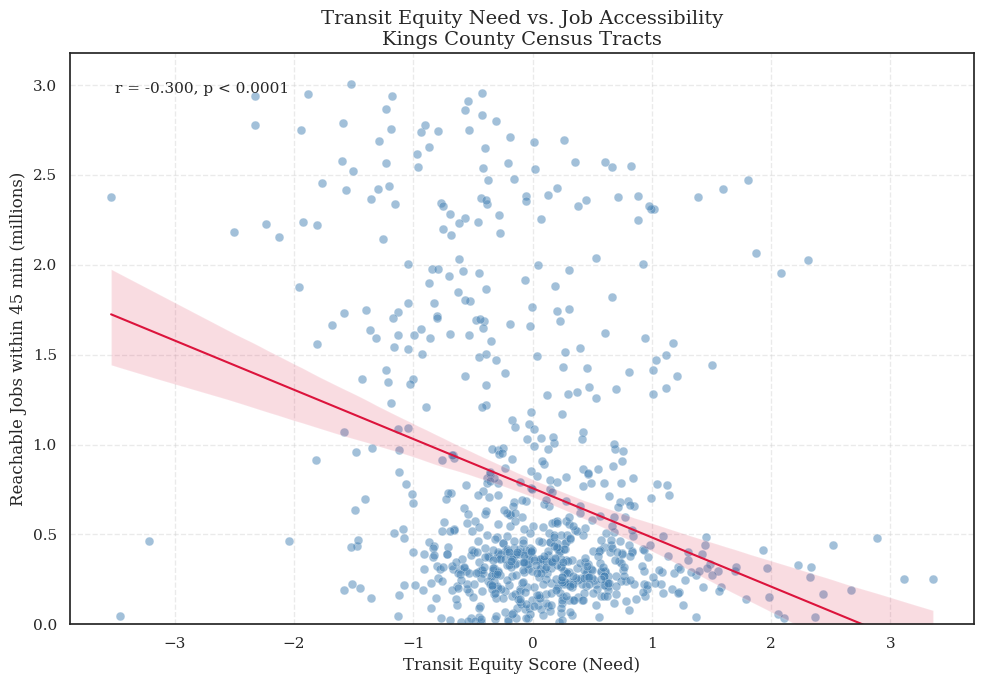

In [70]:
# Visualizing the transit equity score and job accessibility
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(figsize=(10, 7))

sns.regplot(
    data=gdf_clean,
    x="Transit_Equity_Score",
    y=gdf_clean["reachable_jobs"] / 1_000_000,
    ax=ax,
    scatter_kws={"alpha": 0.5, "s": 40, "edgecolors": "white", "linewidths": 0.3},
    line_kws={"color": "crimson", "linewidth": 1.5},
    color="steelblue"
)

ax.set_ylim(bottom=0)
ax.set_xlabel("Transit Equity Score (Need)", fontsize=12)
ax.set_ylabel("Reachable Jobs within 45 min (millions)", fontsize=12)
ax.set_title("Transit Equity Need vs. Job Accessibility\nKings County Census Tracts", fontsize=14)
ax.text(
    0.05, 0.95, "r = -0.300, p < 0.0001",
    transform=ax.transAxes,
    fontsize=11,
    verticalalignment="top"
)
ax.grid(True, linestyle="--", alpha=0.4)

plt.tight_layout()
plt.savefig(
    "/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/scatterplot_need_vs_access.png",
    dpi=150, bbox_inches="tight"
)
plt.show()

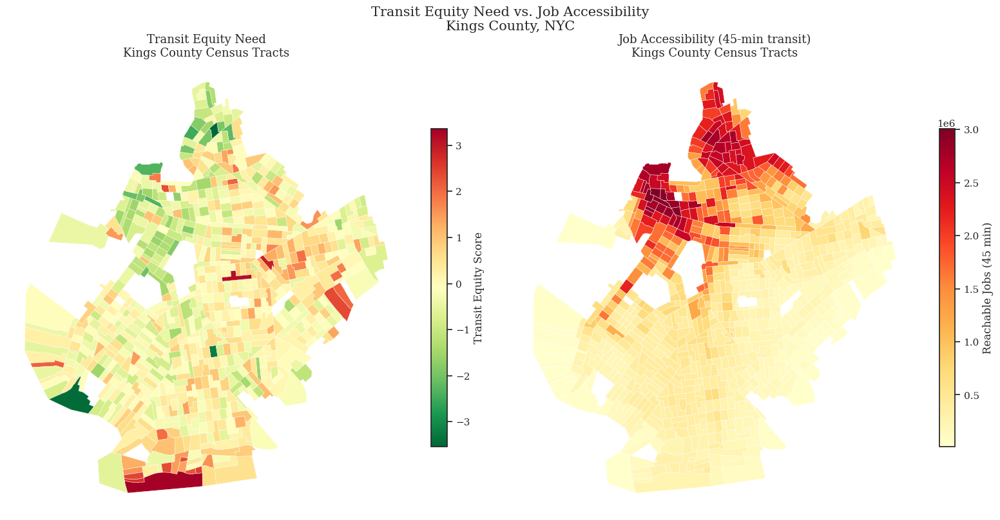

In [71]:
# Cloropleths to visualize data spatially
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Reproject to a projected CRS for mapping
gdf_plot = gdf_clean.to_crs(epsg=32618)

# --- Map 1: Transit Equity Score (Need) ---
gdf_plot.plot(
    column="Transit_Equity_Score",
    ax=axes[0],
    cmap="RdYlGn_r",
    legend=True,
    legend_kwds={"label": "Transit Equity Score", "shrink": 0.7},
    edgecolor="white",
    linewidth=0.3
)
axes[0].set_title("Transit Equity Need\nKings County Census Tracts", fontsize=13)
axes[0].axis("off")

# --- Map 2: Reachable Jobs ---
gdf_plot.plot(
    column="reachable_jobs",
    ax=axes[1],
    cmap="YlOrRd",
    legend=True,
    legend_kwds={"label": "Reachable Jobs (45 min)", "shrink": 0.7},
    edgecolor="white",
    linewidth=0.3
)
axes[1].set_title("Job Accessibility (45-min transit)\nKings County Census Tracts", fontsize=13)
axes[1].axis("off")

plt.suptitle("Transit Equity Need vs. Job Accessibility\nKings County, NYC", fontsize=15, y=1.01)
plt.tight_layout()
plt.savefig(
    "/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/choropleth_need_vs_access.png",
    dpi=150, bbox_inches="tight"
)
plt.show()

# QUADRANT ANALYSIS

In [72]:
# Compute medians
need_median = gdf_clean["Transit_Equity_Score"].median()
access_median = gdf_clean["reachable_jobs"].median()

print(f"Need median: {need_median:.3f}")
print(f"Access median: {access_median:,.0f}")

# Assign quadrant labels
def assign_quadrant(row):
    high_need = row["Transit_Equity_Score"] > need_median
    high_access = row["reachable_jobs"] > access_median
    if high_need and not high_access:
        return "High Need, Low Access"      # most concerning
    elif high_need and high_access:
        return "High Need, High Access"     # decent connectivity despite need
    elif not high_need and not high_access:
        return "Low Need, Low Access"       # average/moderate tracts
    else:
        return "Low Need, High Access"      # best served

gdf_clean = gdf_clean.copy()
gdf_clean["quadrant"] = gdf_clean.apply(assign_quadrant, axis=1)

# Count tracts per quadrant
print(gdf_clean["quadrant"].value_counts())

Need median: -0.009
Access median: 410,037
quadrant
Low Need, High Access     222
High Need, Low Access     222
Low Need, Low Access      165
High Need, High Access    165
Name: count, dtype: int64


In [73]:
# Save the gdf_clean with the added quadrant classification
gdf_clean.to_parquet("/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/gdf_clean_quadrant.parquet")

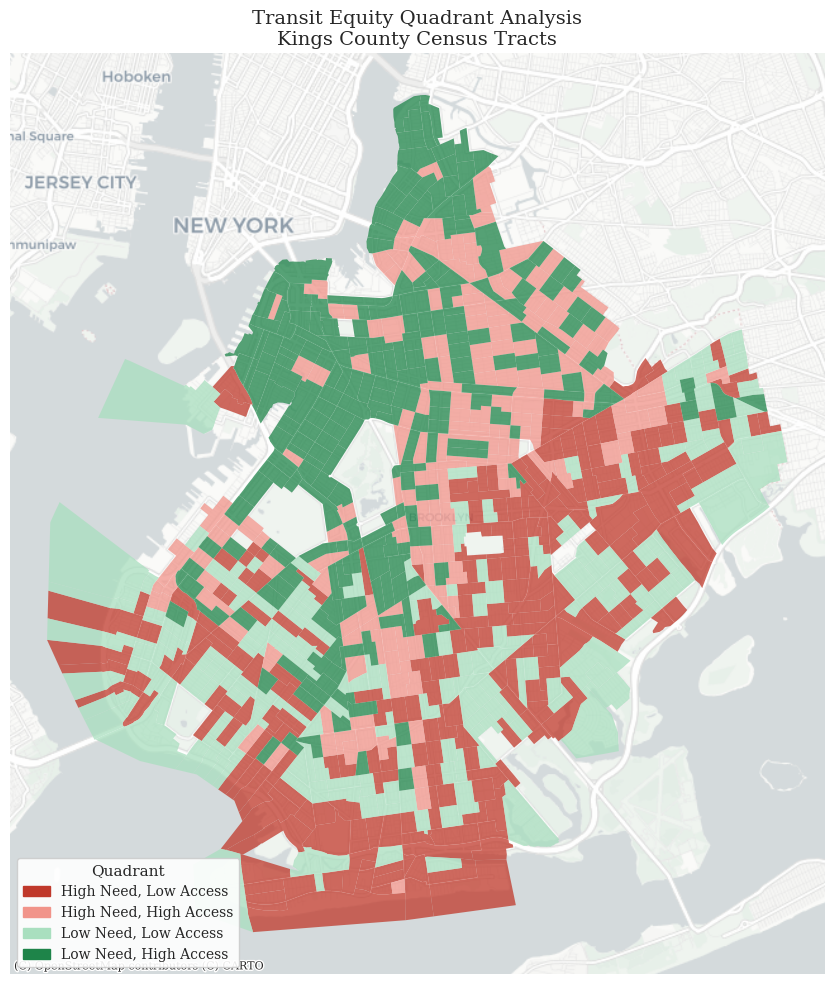

In [74]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

quadrant_colors = {
    "High Need, Low Access": "#c0392b",       # strong red
    "High Need, High Access": "#f1948a",      # light salmon pink
    "Low Need, Low Access": "#a9dfbf",        # light mint green
    "Low Need, High Access": "#1e8449",       # strong green
}

fig, ax = plt.subplots(figsize=(12, 10))

gdf_plot = gdf_clean.to_crs(epsg=3857)

for quadrant, color in quadrant_colors.items():
    gdf_plot[gdf_plot["quadrant"] == quadrant].plot(
        ax=ax,
        color=color,
        edgecolor="white",
        linewidth=0.01,
        alpha=0.75
    )

ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron,
    zoom=12
)

patches = [mpatches.Patch(color=color, label=label) for label, color in quadrant_colors.items()]
ax.legend(
    handles=patches,
    title="Quadrant",
    loc="lower left",
    fontsize=10,
    title_fontsize=11,
    framealpha=0.9
)

ax.set_title("Transit Equity Quadrant Analysis\nKings County Census Tracts", fontsize=14)
ax.axis("off")

plt.tight_layout()
plt.savefig(
    "/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/quadrant_map.png",
    dpi=150, bbox_inches="tight"
)
plt.show()

In [75]:
import matplotlib.pyplot as plt
import seaborn as sns

# ── Figure 2: Scatterplot ───────────────────────────────────────────────────
import seaborn as sns

fig, ax = plt.subplots(figsize=(10, 7))

sns.regplot(
    data=gdf_clean,
    x="Transit_Equity_Score",
    y=gdf_clean["reachable_jobs"] / 1_000_000,
    ax=ax,
    scatter_kws={"alpha": 0.5, "s": 40, "edgecolors": "white", "linewidths": 0.3},
    line_kws={"color": "crimson", "linewidth": 1.5},
    color="steelblue"
)

ax.set_ylim(bottom=0)
ax.set_xlabel("Transit Equity Priority Index (TEPI)", fontsize=12)
ax.set_ylabel("Reachable Jobs within 45 min (millions)", fontsize=12)
ax.text(0.05, 0.95, "r = −0.300, p < 0.0001",
        transform=ax.transAxes, fontsize=11, verticalalignment="top")
ax.grid(True, linestyle="--", alpha=0.4)

plt.tight_layout()
plt.savefig(
    "/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/Figure2.jpeg",
    dpi=300, bbox_inches="tight", format="jpeg"
)
plt.close()
print("Figure 2 saved")

Figure 2 saved


In [76]:
!pip install matplotlib-scalebar -q

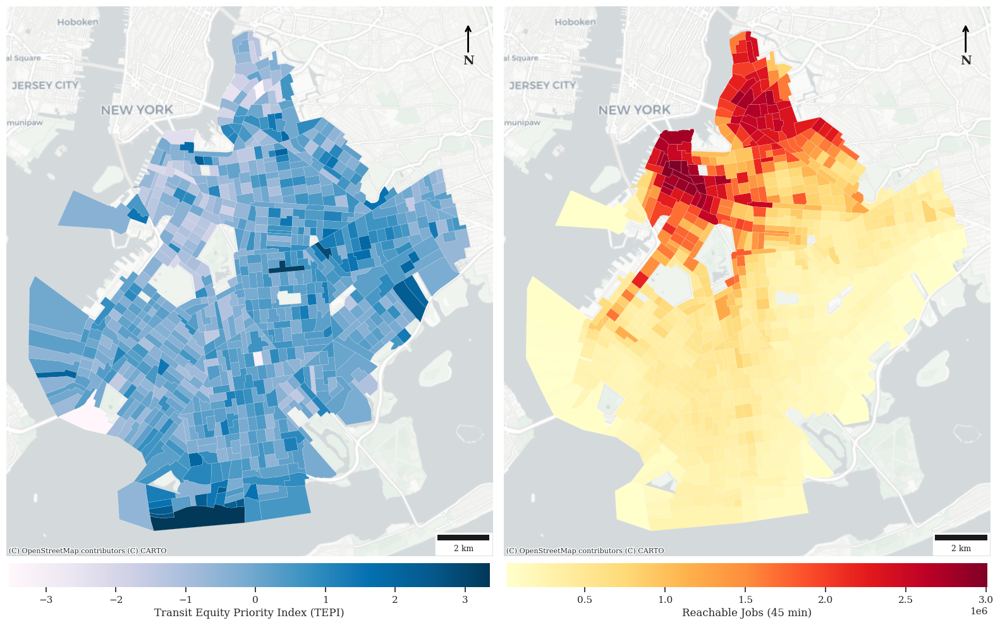

In [77]:
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
import matplotlib.patheffects as pe
import matplotlib.patches as mpatches

# Calculate vmin and vmax for each colorbar
vmin0 = gdf_clean["Transit_Equity_Score"].min()
vmax0 = gdf_clean["Transit_Equity_Score"].max()
vmin1 = gdf_clean["reachable_jobs"].min()
vmax1 = gdf_clean["reachable_jobs"].max()

fig, axes = plt.subplots(1, 2, figsize=(16, 12))

gdf_plot = gdf_clean.to_crs(epsg=32618)

gdf_plot.plot(
    column="Transit_Equity_Score",
    ax=axes[0],
    cmap="PuBu",
    legend=False,
    edgecolor="white",
    linewidth=0.1
)
axes[0].axis("off")

# Scale bar - left map
axes[0].add_artist(ScaleBar(1, units="m", location="lower right",
                             length_fraction=0.2, font_properties={"size": 9}))
# North arrow - left map
axes[0].annotate("N", xy=(0.95, 0.97), xycoords="axes fraction",
                 fontsize=14, ha="center", va="top", fontweight="bold",
                 xytext=(0.95, 0.91),
                 arrowprops=dict(arrowstyle="->", color="black", lw=2))

# Manually add horizontal colorbar below Axis 0
sm0 = plt.cm.ScalarMappable(cmap="PuBu", norm=plt.Normalize(vmin=vmin0, vmax=vmax0))
cbar0 = fig.colorbar(
    sm0,
    ax=axes[0],
    orientation="horizontal",
    pad=0.01,
    shrink=0.99,
    label="Transit Equity Priority Index (TEPI)"
)
cbar0.outline.set_visible(False)

gdf_plot.plot(
    column="reachable_jobs", # Corrected column name
    ax=axes[1],
    cmap="YlOrRd",
    legend=False,
    edgecolor="white",
    linewidth=0.1
)
axes[1].axis("off")

# Scale bar - right map
axes[1].add_artist(ScaleBar(1, units="m", location="lower right",
                             length_fraction=0.2, font_properties={"size": 9}))
# North arrow - right map
axes[1].annotate("N", xy=(0.95, 0.97), xycoords="axes fraction",
                 fontsize=14, ha="center", va="top", fontweight="bold",
                 xytext=(0.95, 0.91),
                 arrowprops=dict(arrowstyle="->", color="black", lw=2))

# Manually add horizontal colorbar below Axis 1
sm1 = plt.cm.ScalarMappable(cmap="YlOrRd", norm=plt.Normalize(vmin=vmin1, vmax=vmax1))
cbar1 = fig.colorbar(
    sm1,
    ax=axes[1],
    orientation="horizontal",
    pad=0.01,
    shrink=0.99,
    label="Reachable Jobs (45 min)"
)
cbar1.outline.set_visible(False)

# add basemap for each figure, explicitly passing the CRS
ctx.add_basemap(axes[0], source=ctx.providers.CartoDB.Positron, zoom=12, crs=gdf_plot.crs.to_string())
ctx.add_basemap(axes[1], source=ctx.providers.CartoDB.Positron, zoom=12, crs=gdf_plot.crs.to_string())

plt.tight_layout()
plt.show()
plt.savefig(
    "/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/Figure1.jpeg",
    dpi=300, bbox_inches="tight", format="jpeg"
)

plt.close()

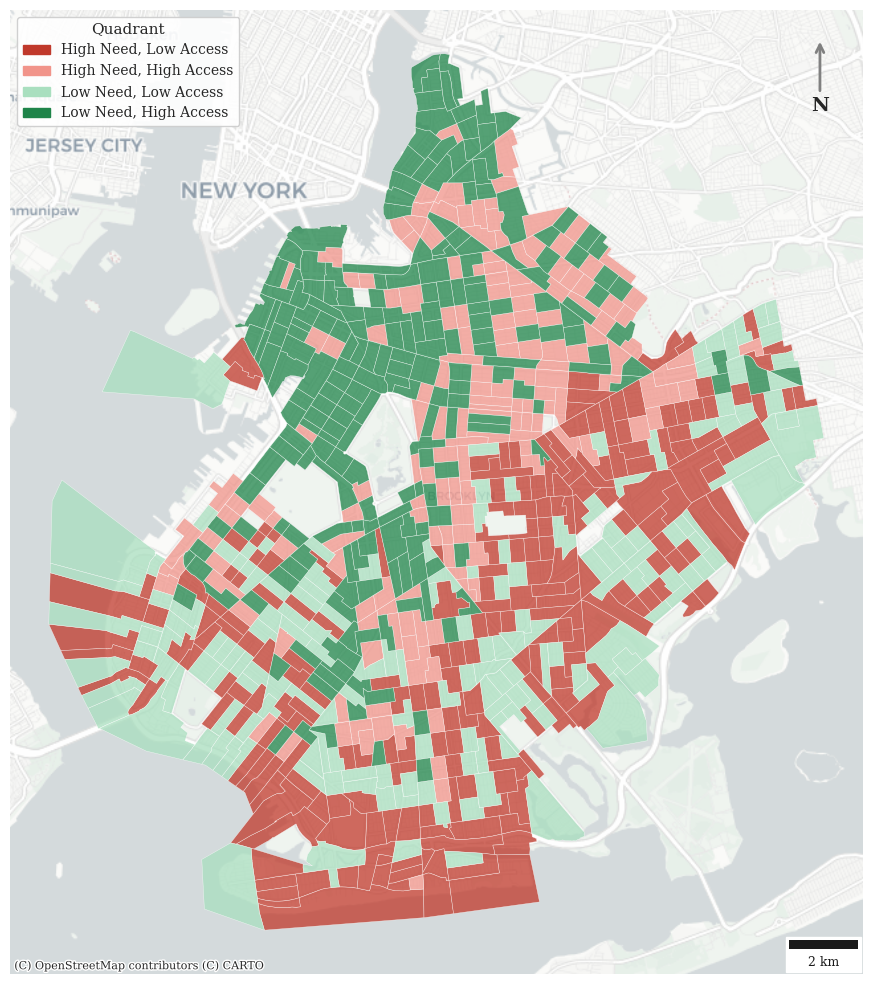

In [78]:
fig, ax = plt.subplots(figsize=(12, 10))

gdf_plot = gdf_clean.to_crs(epsg=3857)

for quadrant, color in quadrant_colors.items():
    gdf_plot[gdf_plot["quadrant"] == quadrant].plot(
        ax=ax, color=color, edgecolor="white", linewidth=0.3, alpha=0.75
    )

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, zoom=12)

patches = [mpatches.Patch(color=color, label=label) for label, color in quadrant_colors.items()]
ax.legend(handles=patches, title="Quadrant", loc="upper left",
          fontsize=10, title_fontsize=11, framealpha=0.9)

# Scale bar
ax.add_artist(ScaleBar(1, units="m", location="lower right",
                        length_fraction=0.2, font_properties={"size": 9}))

# North arrow
ax.annotate("N", xy=(0.95, 0.97), xycoords="axes fraction",
            fontsize=14, ha="center", va="top", fontweight="bold",
            xytext=(0.95, 0.91),
            arrowprops=dict(arrowstyle="->", color="grey", lw=2))

ax.axis("off")

plt.tight_layout()
plt.savefig(
    "/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/Figure3.jpeg",
    dpi=300, bbox_inches="tight", format="jpeg"
)
plt.show()

### Loading subway stop coordinates from the GTFS feed

In [79]:
import zipfile
import pandas as pd
import geopandas as gpd
import io

with zipfile.ZipFile("/root/.cache/r5py/subway.zip") as z:
    stops = pd.read_csv(io.BytesIO(z.read("stops.txt")))

print(stops.columns.tolist())
print(stops.head())

stations = stops[stops["location_type"] == 1].copy()

# Convert to GeoDataFrame using stop_lat/stop_lon
subway_stations_gdf = gpd.GeoDataFrame(
    stations,
    geometry=gpd.points_from_xy(
        stations["stop_lon"],
        stations["stop_lat"]
    ),
    crs="EPSG:4326"
).to_crs("EPSG:32618")

# Reproject to match your tract data's CRS (EPSG:32618, per your TEPI methodology)
subway_stations_gdf = subway_stations_gdf.to_crs("EPSG:32618")

['stop_id', 'stop_name', 'stop_lat', 'stop_lon', 'location_type', 'parent_station']
  stop_id                  stop_name   stop_lat   stop_lon  location_type  \
0     101  Van Cortlandt Park-242 St  40.889248 -73.898583            1.0   
1    101N  Van Cortlandt Park-242 St  40.889248 -73.898583            NaN   
2    101S  Van Cortlandt Park-242 St  40.889248 -73.898583            NaN   
3     103                     238 St  40.884667 -73.900870            1.0   
4    103N                     238 St  40.884667 -73.900870            NaN   

  parent_station  
0            NaN  
1            101  
2            101  
3            NaN  
4            103  


In [80]:
len(subway_stations_gdf)

496

Total subway stops in feed: 496
Subway stops within Brooklyn: 167


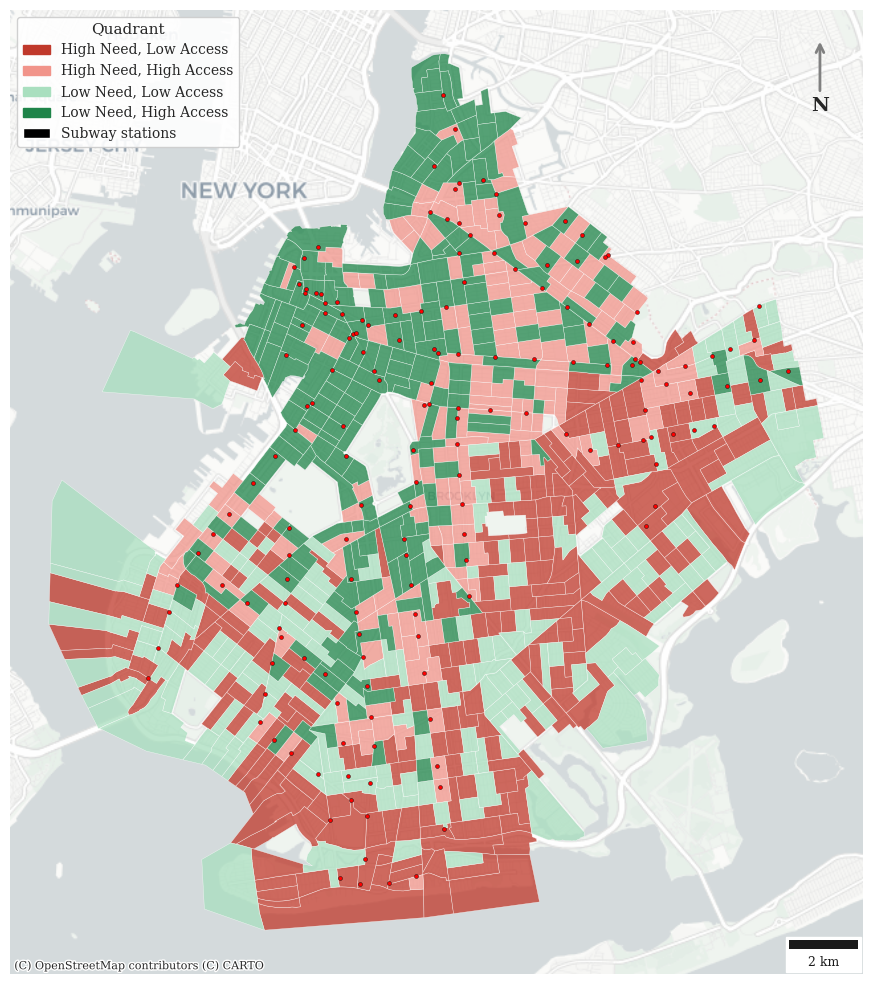

In [81]:
import zipfile
import pandas as pd
import geopandas as gpd
import io

# Extract subway stop locations from your GTFS feed
with zipfile.ZipFile("/root/.cache/r5py/subway.zip") as z:
    stops = pd.read_csv(io.BytesIO(z.read("stops.txt")))

stations = stops[stops["location_type"] == 1].copy()

# Convert to GeoDataFrame using stop_lat/stop_lon
subway_stations_gdf = gpd.GeoDataFrame(
    stations,
    geometry=gpd.points_from_xy(
        stations["stop_lon"],
        stations["stop_lat"]
    ),
    crs="EPSG:4326"
).to_crs(epsg=3857)

# Clip to Brooklyn only, using gdf_clean's extent
gdf_plot = gdf_clean.to_crs(epsg=3857)
brooklyn_boundary = gdf_plot.union_all()  # dissolve all tracts into one boundary polygon
subway_stops_brooklyn = subway_stations_gdf[subway_stations_gdf.within(brooklyn_boundary)]

print(f"Total subway stops in feed: {len(subway_stations_gdf)}")
print(f"Subway stops within Brooklyn: {len(subway_stops_brooklyn)}")

fig, ax = plt.subplots(figsize=(12, 10))

for quadrant, color in quadrant_colors.items():
    gdf_plot[gdf_plot["quadrant"] == quadrant].plot(
        ax=ax, color=color, edgecolor="white", linewidth=0.3, alpha=0.75
    )

# Overlay Brooklyn-only subway stops
subway_stops_brooklyn.plot(
    ax=ax, color="red", markersize=8, marker="o",
    edgecolor="black", linewidth=0.3, zorder=5
)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, zoom=12)

patches = [mpatches.Patch(color=color, label=label) for label, color in quadrant_colors.items()]
patches.append(mpatches.Patch(facecolor="black", edgecolor="white", label="Subway stations"))

ax.legend(handles=patches, title="Quadrant", loc="upper left",
          fontsize=10, title_fontsize=11, framealpha=0.9)

ax.add_artist(ScaleBar(1, units="m", location="lower right",
                        length_fraction=0.2, font_properties={"size": 9}))

ax.annotate("N", xy=(0.95, 0.97), xycoords="axes fraction",
            fontsize=14, ha="center", va="top", fontweight="bold",
            xytext=(0.95, 0.91),
            arrowprops=dict(arrowstyle="->", color="grey", lw=2))

ax.axis("off")

plt.tight_layout()
plt.savefig(
    "/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/Figure3_with_subway.jpeg",
    dpi=300, bbox_inches="tight", format="jpeg"
)
plt.show()

In [82]:
import zipfile
import pandas as pd
import geopandas as gpd
import io

with zipfile.ZipFile("/root/.cache/r5py/brooklyn_bus.zip") as z:
    stops = pd.read_csv(io.BytesIO(z.read("stops.txt")))

print(stops.columns.tolist())
print(stops.head())

['stop_id', 'stop_name', 'stop_desc', 'stop_lat', 'stop_lon', 'zone_id', 'stop_url', 'location_type', 'parent_station']
   stop_id                   stop_name  stop_desc   stop_lat   stop_lon  \
0   300000  ORIENTAL BLVD/MACKENZIE ST        NaN  40.578350 -73.940029   
1   300002    ORIENTAL BLVD/JAFFRAY ST        NaN  40.578066 -73.943029   
2   300003   ORIENTAL BLVD/HASTINGS ST        NaN  40.577909 -73.944643   
3   300004   ORIENTAL BLVD/FALMOUTH ST        NaN  40.577718 -73.946200   
4   300006      ORIENTAL BLVD/DOVER ST        NaN  40.577353 -73.949552   

   zone_id  stop_url  location_type  parent_station  
0      NaN       NaN              0             NaN  
1      NaN       NaN              0             NaN  
2      NaN       NaN              0             NaN  
3      NaN       NaN              0             NaN  
4      NaN       NaN              0             NaN  


In [83]:
# Keep stops/platforms only
bus_stops = stops[
    (stops["location_type"] == 0) |
    (stops["location_type"].isna())
].copy()

In [84]:
bus_stops_gdf = gpd.GeoDataFrame(
    bus_stops,
    geometry=gpd.points_from_xy(
        bus_stops["stop_lon"],
        bus_stops["stop_lat"]
    ),
    crs="EPSG:4326"
).to_crs("EPSG:32618")

In [85]:
print(len(bus_stops_gdf))

4558


Subway stations in Brooklyn: 167
Bus stops in Brooklyn: 3826


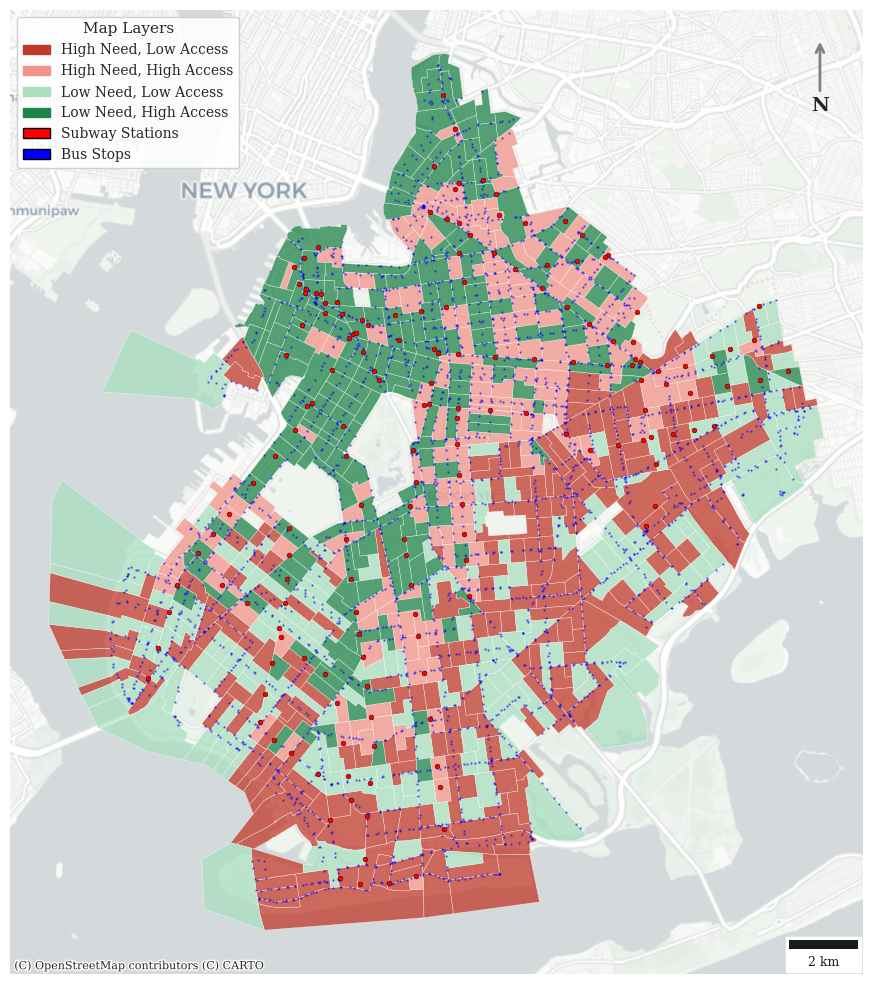

In [86]:
import zipfile
import pandas as pd
import geopandas as gpd
import io
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import contextily as ctx
from matplotlib_scalebar.scalebar import ScaleBar

# SUBWAY STATIONS
with zipfile.ZipFile("/root/.cache/r5py/subway.zip") as z:
    subway_stops = pd.read_csv(io.BytesIO(z.read("stops.txt")))

# Keep station locations only
subway_stations = subway_stops[subway_stops["location_type"] == 1].copy()

subway_stations_gdf = gpd.GeoDataFrame(
    subway_stations,
    geometry=gpd.points_from_xy(
        subway_stations["stop_lon"],
        subway_stations["stop_lat"]
    ),
    crs="EPSG:4326"
).to_crs(epsg=3857)

# BUS STOPS
with zipfile.ZipFile("/root/.cache/r5py/brooklyn_bus.zip") as z:
    bus_stops = pd.read_csv(io.BytesIO(z.read("stops.txt")))

# Keep actual boarding stops
bus_stops = bus_stops[
    (bus_stops["location_type"] == 0) |
    (bus_stops["location_type"].isna())
].copy()

bus_stops_gdf = gpd.GeoDataFrame(
    bus_stops,
    geometry=gpd.points_from_xy(
        bus_stops["stop_lon"],
        bus_stops["stop_lat"]
    ),
    crs="EPSG:4326"
).to_crs(epsg=3857)


# BROOKLYN BOUNDARY
gdf_plot = gdf_clean.to_crs(epsg=3857)

brooklyn_boundary = gdf_plot.union_all()

subway_stops_brooklyn = subway_stations_gdf[
    subway_stations_gdf.within(brooklyn_boundary)
]

bus_stops_brooklyn = bus_stops_gdf[
    bus_stops_gdf.within(brooklyn_boundary)
]

print(f"Subway stations in Brooklyn: {len(subway_stops_brooklyn)}")
print(f"Bus stops in Brooklyn: {len(bus_stops_brooklyn)}")


# PLOT
fig, ax = plt.subplots(figsize=(12, 10))

# Quadrants
for quadrant, color in quadrant_colors.items():
    gdf_plot[gdf_plot["quadrant"] == quadrant].plot(
        ax=ax,
        color=color,
        edgecolor="white",
        linewidth=0.3,
        alpha=0.75
    )

# Bus stops (plot first)
bus_stops_brooklyn.plot(
    ax=ax,
    color="blue",
    markersize=2,
    marker=".",
    alpha=0.5,
    zorder=4
)

# Subway stations (plot on top)
subway_stops_brooklyn.plot(
    ax=ax,
    color="red",
    markersize=12,
    marker="o",
    edgecolor="black",
    linewidth=0.3,
    zorder=5
)

# Basemap
ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron,
    zoom=12
)

# Legend
patches = [
    mpatches.Patch(color=color, label=label)
    for label, color in quadrant_colors.items()
]

patches.append(
    mpatches.Patch(facecolor="red", edgecolor="black",
                   label="Subway Stations")
)

patches.append(
    mpatches.Patch(facecolor="blue", edgecolor="black",
                   label="Bus Stops")
)

ax.legend(
    handles=patches,
    title="Map Layers",
    loc="upper left",
    fontsize=10,
    title_fontsize=11,
    framealpha=0.9
)

# Scale bar
ax.add_artist(
    ScaleBar(
        1,
        units="m",
        location="lower right",
        length_fraction=0.2,
        font_properties={"size": 9}
    )
)

# North arrow
ax.annotate(
    "N",
    xy=(0.95, 0.97),
    xycoords="axes fraction",
    fontsize=14,
    ha="center",
    va="top",
    fontweight="bold",
    xytext=(0.95, 0.91),
    arrowprops=dict(
        arrowstyle="->",
        color="grey",
        lw=2
    )
)

ax.axis("off")

plt.tight_layout()

plt.savefig(
    "/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/Figure3_with_subway_and_bus.jpeg",
    dpi=900,
    bbox_inches="tight",
    format="jpeg"
)

plt.show()

In [87]:
# Converting tract centroid into GeoDataFrame
tract_centroid = gpd.GeoDataFrame(
    tract_centroid,
    geometry="CENTROID",
    crs=kings_tract_jobs.crs
).to_crs(epsg=3857)

In [88]:
# Save tract_centroid
tract_centroid.to_parquet("/content/drive/MyDrive/Colab Notebooks/Project Dream/Data/tract_centroid.parquet")
print("Saved tract_centroid to Drive")

Saved tract_centroid to Drive


In [90]:
print(tract_centroid)

        tract_id                          CENTROID  total_jobs
0    36047000700  POINT (-8237346.589 4967068.789)       859.0
1    36047000900  POINT (-8236707.434 4966976.321)     12596.0
2    36047001100  POINT (-8236274.059 4967206.781)     21611.0
3    36047001300  POINT (-8236346.406 4967841.747)      6416.0
4    36047002000   POINT (-8239415.372 4960565.55)      1496.0
..           ...                               ...         ...
800  36047062000  POINT (-8231623.084 4950466.899)       675.0
801  36047080800   POINT (-8230905.973 4961924.63)      7479.0
802  36047123700  POINT (-8232826.684 4967713.033)      3480.0
803  36047021100  POINT (-8234517.125 4967763.989)      1223.0
804  36047048500  POINT (-8230556.334 4969343.202)      7023.0

[805 rows x 3 columns]
